In [1]:
import streamlit as st
import pandas as pd
import requests
import numpy as np
import yfinance as yf
import matplotlib
%matplotlib inline
import random

C:\Users\brand\AppData\Roaming\Python\Python310\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
import sys
print(sys.executable)

C:\Users\brand\anaconda3\python.exe


In [3]:
random.seed(42)
np.random.seed(42)

# Data Cleaning & Models

## Historical

In [4]:
tbill_path = '../data/3_month_t_bill.csv'
tbill = pd.read_csv(tbill_path)
tbill['decimal'] = tbill['TB3MS'] / 100
current_risk_free = tbill['decimal'].iloc[-1]
current_risk_free

0.0524

In [5]:
assets_path = '../data/asset_prices.csv'
assets = pd.read_csv(assets_path)
assets.dropna(inplace=True)
all_assets = assets.copy()
all_assets = all_assets[all_assets['DAY'] >= '2023-01-22']
assets = assets[assets['DAY'] >= '2023-03-22']
assets

,DAY,SYMBOL,PRICE
0,2024-05-23 00:00:00.000,CDAI,0.023379
1,2024-05-23 00:00:00.000,HOP,0.042247
2,2024-05-23 00:00:00.000,COMP,61.210000
3,2024-05-23 00:00:00.000,USDC,1.000000
4,2024-05-23 00:00:00.000,RETH,4164.540000
...,...,...,...
12007,2023-03-22 00:00:00.000,G,0.013997
12008,2023-03-22 00:00:00.000,USDC,1.010057
12009,2023-03-22 00:00:00.000,COMP,45.707408
12010,2023-03-22 00:00:00.000,RSR,0.004101


In [6]:
all_assets_pivot = all_assets.pivot(index='DAY', columns='SYMBOL', values='PRICE').reset_index()
all_assets_pivot.set_index('DAY', inplace=True)
all_assets_pivot.columns = [f'DAILY_PRICE_{col}' for col in all_assets_pivot.columns]
all_assets_pivot

,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,DAILY_PRICE_ENS,...,DAILY_PRICE_RETH,DAILY_PRICE_RPL,DAILY_PRICE_RSR,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_USDC,DAILY_PRICE_WBTC,DAILY_PRICE_WETH,DAILY_PRICE_WSTETH
DAY,,,,,,,,,,,,,,,,,,,,,
2023-01-22 00:00:00.000,89.229891,0.006462,7.091551,0.027577,0.014806,77.805422,53.171666,463.184016,86.044910,15.040093,...,1770.385012,36.220582,0.004373,25.297558,0.712136,7.116863,1.006145,23040.867210,1657.228155,1826.729861
2023-01-23 00:00:00.000,87.993423,0.006462,7.049982,0.027577,0.017209,77.805422,53.748008,465.045274,85.159956,15.217766,...,1752.609531,36.782880,0.004517,24.793327,0.665175,6.940717,1.008405,23018.957794,1640.164570,1808.082328
2023-01-24 00:00:00.000,88.413674,0.006462,7.049390,0.027577,0.017558,77.805422,53.245861,465.620190,85.054341,15.122363,...,1753.214248,40.436736,0.004716,24.974129,0.732753,6.844909,1.004965,23114.151038,1639.347371,1810.382407
2023-01-25 00:00:00.000,86.696939,0.006462,6.901535,0.027577,0.016392,77.805422,51.354143,473.396814,81.843666,14.732804,...,1709.973065,38.813139,0.004375,24.472066,0.630216,6.676154,1.002467,23269.734200,1601.404300,1768.980753
2023-01-26 00:00:00.000,89.306431,0.006462,7.041247,0.027577,0.016868,77.805422,54.953221,468.150264,83.765201,15.423502,...,1730.804510,40.436324,0.004507,24.861352,0.655578,6.835079,1.005513,23285.348813,1621.049554,1790.625369
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-19 00:00:00.000,88.520000,1.025000,3.580000,0.023384,0.027455,62.970000,57.020000,1351.300000,100.060000,15.340000,...,3471.410000,19.650000,0.009408,175.190000,0.461871,8.400000,1.001000,67264.000000,3136.880000,3656.800000
2024-05-20 00:00:00.000,97.480000,1.130000,3.860000,0.023399,0.028090,73.570000,59.590000,1397.610000,109.170000,18.060000,...,4041.830000,20.520000,0.010004,194.280000,0.468372,9.470000,1.004000,70885.000000,3590.370000,4143.900000
2024-05-21 00:00:00.000,99.500000,1.220000,4.000000,0.023604,0.028904,76.500000,62.390000,1436.750000,115.740000,21.570000,...,4214.140000,21.580000,0.009444,189.480000,0.479769,9.600000,1.001000,71645.000000,3800.340000,4439.160000


In [7]:
all_assets_pivot.describe()

,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,DAILY_PRICE_ENS,...,DAILY_PRICE_RETH,DAILY_PRICE_RPL,DAILY_PRICE_RSR,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_USDC,DAILY_PRICE_WBTC,DAILY_PRICE_WETH,DAILY_PRICE_WSTETH
count,488.000000,488.000000,488.000000,488.000000,488.000000,488.000000,488.000000,488.000000,488.000000,488.000000,...,488.000000,488.000000,488.000000,488.000000,488.000000,488.000000,488.000000,488.000000,488.000000,488.000000
mean,84.826077,1.162493,4.814519,0.026935,0.020252,75.804697,53.385560,777.648032,89.666815,13.285725,...,2417.652152,33.717782,0.003749,63.079678,0.641924,6.789207,1.028711,38305.724433,2205.466159,2519.124190
std,20.189919,0.585476,1.274222,0.001544,0.006351,4.954388,13.813292,299.360986,22.619639,5.353070,...,758.514813,9.892386,0.002150,55.842871,0.151143,2.412859,0.407300,15182.995418,651.164428,778.466704
min,50.880619,0.006462,2.982007,0.022956,0.011238,56.358668,26.830328,411.314787,56.445045,6.825129,...,1537.496328,18.526159,0.001712,14.774575,0.396080,3.954053,0.971359,20381.851873,1439.307319,1600.340465
25%,68.283094,0.964087,3.757454,0.027577,0.015248,77.805422,43.099089,577.761129,72.121179,8.893970,...,1881.772635,26.490727,0.002220,21.554781,0.540197,5.298769,1.001927,27278.175757,1737.243201,1967.957884
50%,83.629886,1.161694,4.464531,0.027577,0.019472,77.805422,52.916957,613.174974,84.674397,12.063160,...,2051.303734,31.143758,0.002942,25.345415,0.612635,6.289761,1.004422,30368.846263,1906.727339,2148.663465
75%,97.293748,1.442142,5.608320,0.027577,0.023897,77.805422,58.786855,886.886219,99.868904,16.114757,...,2630.366766,41.366568,0.004436,103.658174,0.721778,7.034911,1.012852,44109.703155,2403.253112,2761.400740
max,150.004581,5.040700,7.637407,0.027577,0.038868,81.795335,101.769037,1479.002425,160.547280,29.333239,...,4482.072614,61.205782,0.013125,209.828971,1.351916,16.240105,9.996563,73438.397853,4064.937076,4711.805155


In [8]:
import pandas as pd

# Assuming 'assets' data is loaded into a DataFrame called assets_df

# Convert 'DAY' to datetime
assets['DAY'] = pd.to_datetime(assets['DAY'])

# Pivot the data to have symbols as columns
pivot_assets = assets.pivot(index='DAY', columns='SYMBOL', values='PRICE').reset_index()

# Display the pivoted DataFrame
print(pivot_assets.head())
pivot_assets.set_index('DAY', inplace=True)

SYMBOL        DAY       AAVE       ARB       BAL      CDAI      CELR  \
0      2023-03-22  79.461948  0.006462  6.802698  0.027577  0.024491   
1      2023-03-23  80.428747  5.040700  7.088430  0.027577  0.027595   
2      2023-03-24  77.534546  1.530576  7.086101  0.027577  0.027602   
3      2023-03-25  73.688440  1.293759  6.782021  0.027577  0.029137   
4      2023-03-26  73.482201  1.339754  6.817793  0.027577  0.027798   

SYMBOL       CETH       COMP       CWBTC        DPI  ...         RETH  \
0       77.805422  45.707408  578.460823  84.457211  ...  1943.193724   
1       77.805422  44.715594  577.837315  83.412666  ...  1978.132073   
2       77.805422  44.523301  573.250163  82.238418  ...  1952.633363   
3       77.805422  42.745369  560.406636  78.278926  ...  1893.528757   
4       77.805422  43.097157  568.366841  78.453328  ...  1924.050865   

SYMBOL        RPL       RSR        SOL       STG       UNI      USDC  \
0       41.027989  0.004101  22.885376  0.750757  6.4643

In [9]:
pivot_assets.columns = [f'DAILY_PRICE_{col}' for col in pivot_assets.columns]
pivot_assets = pivot_assets.reset_index()
pivot_assets

,DAY,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,...,DAILY_PRICE_RETH,DAILY_PRICE_RPL,DAILY_PRICE_RSR,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_USDC,DAILY_PRICE_WBTC,DAILY_PRICE_WETH,DAILY_PRICE_WSTETH
0,2023-03-22,79.461948,0.006462,6.802698,0.027577,0.024491,77.805422,45.707408,578.460823,84.457211,...,1943.193724,41.027989,0.004101,22.885376,0.750757,6.464313,1.010057,28791.601013,1817.378490,2023.790378
1,2023-03-23,80.428747,5.040700,7.088430,0.027577,0.027595,77.805422,44.715594,577.837315,83.412666,...,1978.132073,40.578442,0.004150,26.028662,0.714423,6.448413,1.011716,28754.493594,1846.091458,2058.390353
2,2023-03-24,77.534546,1.530576,7.086101,0.027577,0.027602,77.805422,44.523301,573.250163,82.238418,...,1952.633363,40.343656,0.004183,22.130990,0.718028,6.314177,1.008786,28510.610009,1824.260370,2032.886739
3,2023-03-25,73.688440,1.293759,6.782021,0.027577,0.029137,77.805422,42.745369,560.406636,78.278926,...,1893.528757,38.857283,0.004009,21.123700,0.665835,6.008362,1.008728,27881.394353,1766.906936,1968.846231
4,2023-03-26,73.482201,1.339754,6.817793,0.027577,0.027798,77.805422,43.097157,568.366841,78.453328,...,1924.050865,42.375331,0.003943,21.123650,0.662433,5.870104,1.008116,28280.352719,1799.517247,2006.394028
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
424,2024-05-19,88.520000,1.025000,3.580000,0.023384,0.027455,62.970000,57.020000,1351.300000,100.060000,...,3471.410000,19.650000,0.009408,175.190000,0.461871,8.400000,1.001000,67264.000000,3136.880000,3656.800000
425,2024-05-20,97.480000,1.130000,3.860000,0.023399,0.028090,73.570000,59.590000,1397.610000,109.170000,...,4041.830000,20.520000,0.010004,194.280000,0.468372,9.470000,1.004000,70885.000000,3590.370000,4143.900000
426,2024-05-21,99.500000,1.220000,4.000000,0.023604,0.028904,76.500000,62.390000,1436.750000,115.740000,...,4214.140000,21.580000,0.009444,189.480000,0.479769,9.600000,1.001000,71645.000000,3800.340000,4439.160000
427,2024-05-22,97.210000,1.210000,4.020000,0.023422,0.028132,76.350000,62.120000,1414.080000,114.450000,...,4202.870000,22.800000,0.008774,182.220000,0.490497,9.680000,1.002000,70668.000000,3794.940000,4429.320000


In [10]:
panamadao_path = '../data/panamadao_returns.csv'
panamadao_returns = pd.read_csv(panamadao_path)
panamadao_returns.dropna(inplace=True)
panamadao_returns

,DAY,SYMBOL,TOTAL_FILLED_BALANCE,DAILY_PRICE,TOTAL_VALUE_IN_USD,TOTAL_USD_IN_TREASURY,COMPOSITION
0,2023-03-22 00:00:00.000,ETH,0.100000,1743.360000,174.336000,174.336000,1.000000
1,2023-03-22 00:00:00.000,USDC,0.000000,1.000000,0.000000,174.336000,0.000000
2,2023-03-22 00:00:00.000,WETH,0.000000,1743.360000,0.000000,174.336000,0.000000
3,2023-03-23 00:00:00.000,ETH,0.140000,1825.050000,255.507000,255.507000,1.000000
4,2023-03-23 00:00:00.000,USDC,0.000000,1.000000,0.000000,255.507000,0.000000
...,...,...,...,...,...,...,...
1258,2024-05-14 00:00:00.000,USDC,270.659535,0.999893,270.630574,32341.145506,0.008368
1259,2024-05-14 00:00:00.000,WETH,0.001900,2881.980000,5.475762,32341.145506,0.000169
1260,2024-05-15 00:00:00.000,ETH,11.230723,3021.480000,33933.404930,34209.805277,0.991920
1261,2024-05-15 00:00:00.000,USDC,270.659535,1.000000,270.659535,34209.805277,0.007912


In [11]:
panama_dao_assets = panamadao_returns['SYMBOL'].unique()

In [12]:
# Convert 'DAY' to datetime
panamadao_returns['DAY'] = pd.to_datetime(panamadao_returns['DAY'])

# Sort by 'DAY' and 'SYMBOL'
panamadao_returns = panamadao_returns.sort_values(by=['DAY', 'SYMBOL'])

# Calculate previous day price
panamadao_returns['prev_day_price'] = panamadao_returns.groupby('SYMBOL')['DAILY_PRICE'].shift(1)

# Calculate daily return
panamadao_returns['daily_return'] = (panamadao_returns['DAILY_PRICE'] - panamadao_returns['prev_day_price']) / panamadao_returns['prev_day_price']

# Calculate weighted daily return
panamadao_returns['weighted_daily_return1'] = panamadao_returns['daily_return'] * panamadao_returns['COMPOSITION']

# Filter dates after '2023-07-01'
filtered_returns = panamadao_returns

# Calculate weighted daily return per day
weighted_daily_returns = filtered_returns.groupby('DAY').apply(lambda x: (x['daily_return'] * x['COMPOSITION']).sum()).reset_index(name='weighted_daily_return')

# Calculate cumulative returns
weighted_daily_returns['daily_factor'] = 1 + weighted_daily_returns['weighted_daily_return']
weighted_daily_returns['cumulative_return'] = (np.exp(np.log(weighted_daily_returns['daily_factor']).cumsum()) - 1)

# Calculate metrics
average_daily_return = weighted_daily_returns['weighted_daily_return'].mean()
stddev_daily_return = weighted_daily_returns['weighted_daily_return'].std()

# Calculate Sharpe ratio
annualized_return = average_daily_return * 365
annualized_risk = stddev_daily_return * np.sqrt(365)
sharpe_ratio = (annualized_return - current_risk_free) / annualized_risk

# Prepare base return
base_return = weighted_daily_returns[['DAY', 'cumulative_return']].copy()
base_return = base_return.dropna().rename(columns={'cumulative_return': 'base_cumulative_return'})

# Combine results
combined = base_return[['DAY', 'base_cumulative_return']].sort_values('DAY')

# Normalize returns
first_value = combined['base_cumulative_return'].iloc[0]
combined['PanamaDAO_treasury_return'] = 100 + (100 * (combined['base_cumulative_return'] - first_value))

# Final output
historical_normalized_returns = combined[['DAY', 'PanamaDAO_treasury_return']]

print(historical_normalized_returns)

           DAY  PanamaDAO_treasury_return
0   2023-03-22                 100.000000
1   2023-03-23                 104.685779
2   2023-03-24                 101.257342
3   2023-03-25                 100.418732
4   2023-03-26                 102.108572
..         ...                        ...
416 2024-05-11                 166.906223
417 2024-05-12                 167.761691
418 2024-05-13                 168.638729
419 2024-05-14                 164.987403
420 2024-05-15                 172.910446

[421 rows x 2 columns]


C:\Users\brand\AppData\Local\Temp\ipykernel_11560\1859384667.py:20: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  weighted_daily_returns = filtered_returns.groupby('DAY').apply(lambda x: (x['daily_return'] * x['COMPOSITION']).sum()).reset_index(name='weighted_daily_return')


In [13]:
historical_normalized_returns.set_index('DAY', inplace=True)

<Axes: xlabel='DAY'>

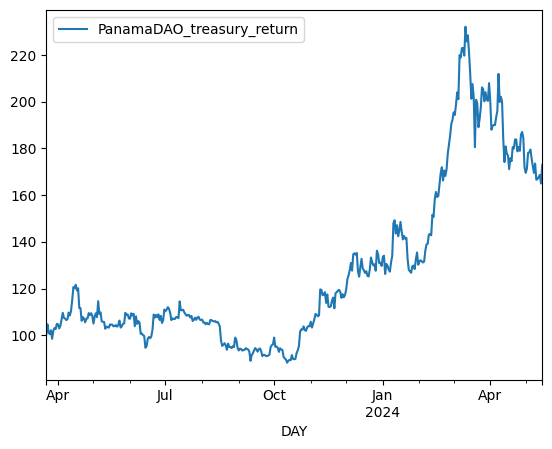

In [14]:
historical_normalized_returns.plot()

In [15]:
panamadao_returns

,DAY,SYMBOL,TOTAL_FILLED_BALANCE,DAILY_PRICE,TOTAL_VALUE_IN_USD,TOTAL_USD_IN_TREASURY,COMPOSITION,prev_day_price,daily_return,weighted_daily_return1
0,2023-03-22,ETH,0.100000,1743.360000,174.336000,174.336000,1.000000,NaN,NaN,NaN
1,2023-03-22,USDC,0.000000,1.000000,0.000000,174.336000,0.000000,NaN,NaN,NaN
2,2023-03-22,WETH,0.000000,1743.360000,0.000000,174.336000,0.000000,NaN,NaN,NaN
3,2023-03-23,ETH,0.140000,1825.050000,255.507000,255.507000,1.000000,1743.360000,0.046858,4.685779e-02
4,2023-03-23,USDC,0.000000,1.000000,0.000000,255.507000,0.000000,1.000000,0.000000,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...
1258,2024-05-14,USDC,270.659535,0.999893,270.630574,32341.145506,0.008368,0.999938,-0.000045,-3.765832e-07
1259,2024-05-14,WETH,0.001900,2881.980000,5.475762,32341.145506,0.000169,2946.310000,-0.021834,-3.696786e-06
1260,2024-05-15,ETH,11.230723,3021.480000,33933.404930,34209.805277,0.991920,2881.980000,0.048404,4.801314e-02
1261,2024-05-15,USDC,270.659535,1.000000,270.659535,34209.805277,0.007912,0.999893,0.000107,8.466482e-07


In [16]:
pivot_data = panamadao_returns.pivot(index='DAY', columns='SYMBOL', values=['TOTAL_FILLED_BALANCE', 'DAILY_PRICE', 'TOTAL_VALUE_IN_USD', 'COMPOSITION'])
pivot_data.columns = ['_'.join(col).strip() for col in pivot_data.columns.values]
pivot_data = pivot_data.reset_index()

In [17]:
pivot_data.set_index('DAY', inplace=True)
pivot_data

,TOTAL_FILLED_BALANCE_ETH,TOTAL_FILLED_BALANCE_USDC,TOTAL_FILLED_BALANCE_WETH,DAILY_PRICE_ETH,DAILY_PRICE_USDC,DAILY_PRICE_WETH,TOTAL_VALUE_IN_USD_ETH,TOTAL_VALUE_IN_USD_USDC,TOTAL_VALUE_IN_USD_WETH,COMPOSITION_ETH,COMPOSITION_USDC,COMPOSITION_WETH
DAY,,,,,,,,,,,,
2023-03-22,0.100000,0.000000,0.0000,1743.36,1.000000,1743.36,174.336000,0.000000,0.000000,1.000000,0.000000,0.000000
2023-03-23,0.140000,0.000000,0.0000,1825.05,1.000000,1825.05,255.507000,0.000000,0.000000,1.000000,0.000000,0.000000
2023-03-24,0.437000,0.000000,0.0000,1765.28,1.010000,1765.28,771.427360,0.000000,0.000000,1.000000,0.000000,0.000000
2023-03-25,0.437000,0.000000,0.0000,1750.66,1.010000,1750.66,765.038420,0.000000,0.000000,1.000000,0.000000,0.000000
2023-03-26,0.447000,0.000000,0.0000,1780.12,0.999827,1780.12,795.713640,0.000000,0.000000,1.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-11,11.047240,270.659535,0.0019,2915.79,1.000000,2915.79,32211.431920,270.659535,5.540001,0.991498,0.008331,0.000171
2024-05-12,11.062640,270.659535,0.0019,2930.86,0.999977,2930.86,32423.049070,270.653310,5.568634,0.991553,0.008277,0.000170
2024-05-13,11.090865,270.659535,0.0019,2946.31,0.999938,2946.31,32677.126458,270.642754,5.597989,0.991617,0.008213,0.000170


In [18]:
filtered_columns = [col for col in pivot_data.columns if 'COMPOSITION_' in col or 'DAILY_PRICE_' in col]
pivot_data_filtered = pivot_data[filtered_columns]
pivot_data_filtered


,DAILY_PRICE_ETH,DAILY_PRICE_USDC,DAILY_PRICE_WETH,COMPOSITION_ETH,COMPOSITION_USDC,COMPOSITION_WETH
DAY,,,,,,
2023-03-22,1743.36,1.000000,1743.36,1.000000,0.000000,0.000000
2023-03-23,1825.05,1.000000,1825.05,1.000000,0.000000,0.000000
2023-03-24,1765.28,1.010000,1765.28,1.000000,0.000000,0.000000
2023-03-25,1750.66,1.010000,1750.66,1.000000,0.000000,0.000000
2023-03-26,1780.12,0.999827,1780.12,1.000000,0.000000,0.000000
...,...,...,...,...,...,...
2024-05-11,2915.79,1.000000,2915.79,0.991498,0.008331,0.000171
2024-05-12,2930.86,0.999977,2930.86,0.991553,0.008277,0.000170
2024-05-13,2946.31,0.999938,2946.31,0.991617,0.008213,0.000170


In [19]:
# Convert assets DataFrame to wide format
assets_pivot = assets.pivot(index='DAY', columns='SYMBOL', values='PRICE')

# Rename columns to match the format in pivot_data_filtered
assets_pivot.columns = [f'DAILY_PRICE_{col}' for col in assets_pivot.columns]
assets_pivot.index

DatetimeIndex(['2023-03-22', '2023-03-23', '2023-03-24', '2023-03-25',
               '2023-03-26', '2023-03-27', '2023-03-28', '2023-03-29',
               '2023-03-30', '2023-03-31',
               ...
               '2024-05-14', '2024-05-15', '2024-05-16', '2024-05-17',
               '2024-05-18', '2024-05-19', '2024-05-20', '2024-05-21',
               '2024-05-22', '2024-05-23'],
              dtype='datetime64[ns]', name='DAY', length=429, freq=None)

In [20]:
assets_pivot

,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,DAILY_PRICE_ENS,...,DAILY_PRICE_RETH,DAILY_PRICE_RPL,DAILY_PRICE_RSR,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_USDC,DAILY_PRICE_WBTC,DAILY_PRICE_WETH,DAILY_PRICE_WSTETH
DAY,,,,,,,,,,,,,,,,,,,,,
2023-03-22,79.461948,0.006462,6.802698,0.027577,0.024491,77.805422,45.707408,578.460823,84.457211,14.396200,...,1943.193724,41.027989,0.004101,22.885376,0.750757,6.464313,1.010057,28791.601013,1817.378490,2023.790378
2023-03-23,80.428747,5.040700,7.088430,0.027577,0.027595,77.805422,44.715594,577.837315,83.412666,14.130395,...,1978.132073,40.578442,0.004150,26.028662,0.714423,6.448413,1.011716,28754.493594,1846.091458,2058.390353
2023-03-24,77.534546,1.530576,7.086101,0.027577,0.027602,77.805422,44.523301,573.250163,82.238418,14.024320,...,1952.633363,40.343656,0.004183,22.130990,0.718028,6.314177,1.008786,28510.610009,1824.260370,2032.886739
2023-03-25,73.688440,1.293759,6.782021,0.027577,0.029137,77.805422,42.745369,560.406636,78.278926,13.468169,...,1893.528757,38.857283,0.004009,21.123700,0.665835,6.008362,1.008728,27881.394353,1766.906936,1968.846231
2023-03-26,73.482201,1.339754,6.817793,0.027577,0.027798,77.805422,43.097157,568.366841,78.453328,13.445209,...,1924.050865,42.375331,0.003943,21.123650,0.662433,5.870104,1.008116,28280.352719,1799.517247,2006.394028
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-19,88.520000,1.025000,3.580000,0.023384,0.027455,62.970000,57.020000,1351.300000,100.060000,15.340000,...,3471.410000,19.650000,0.009408,175.190000,0.461871,8.400000,1.001000,67264.000000,3136.880000,3656.800000
2024-05-20,97.480000,1.130000,3.860000,0.023399,0.028090,73.570000,59.590000,1397.610000,109.170000,18.060000,...,4041.830000,20.520000,0.010004,194.280000,0.468372,9.470000,1.004000,70885.000000,3590.370000,4143.900000
2024-05-21,99.500000,1.220000,4.000000,0.023604,0.028904,76.500000,62.390000,1436.750000,115.740000,21.570000,...,4214.140000,21.580000,0.009444,189.480000,0.479769,9.600000,1.001000,71645.000000,3800.340000,4439.160000


In [21]:
pivot_data_filtered.index = pd.to_datetime(pivot_data_filtered.index)

In [22]:
all_assets_pivot.index = pd.to_datetime(all_assets_pivot.index)
all_assets_pivot.index

DatetimeIndex(['2023-01-22', '2023-01-23', '2023-01-24', '2023-01-25',
               '2023-01-26', '2023-01-27', '2023-01-28', '2023-01-29',
               '2023-01-30', '2023-01-31',
               ...
               '2024-05-14', '2024-05-15', '2024-05-16', '2024-05-17',
               '2024-05-18', '2024-05-19', '2024-05-20', '2024-05-21',
               '2024-05-22', '2024-05-23'],
              dtype='datetime64[ns]', name='DAY', length=488, freq=None)

In [23]:
pivot_data_filtered.index

DatetimeIndex(['2023-03-22', '2023-03-23', '2023-03-24', '2023-03-25',
               '2023-03-26', '2023-03-27', '2023-03-28', '2023-03-29',
               '2023-03-30', '2023-03-31',
               ...
               '2024-05-06', '2024-05-07', '2024-05-08', '2024-05-09',
               '2024-05-10', '2024-05-11', '2024-05-12', '2024-05-13',
               '2024-05-14', '2024-05-15'],
              dtype='datetime64[ns]', name='DAY', length=421, freq=None)

In [24]:
pivot_data_filtered.columns

Index(['DAILY_PRICE_ETH', 'DAILY_PRICE_USDC', 'DAILY_PRICE_WETH',
       'COMPOSITION_ETH', 'COMPOSITION_USDC', 'COMPOSITION_WETH'],
      dtype='object')

In [25]:
pivot_data_filtered_no_price = pivot_data_filtered.drop(columns=['DAILY_PRICE_ETH', 'DAILY_PRICE_USDC', 'DAILY_PRICE_WETH'])

combined_all_assets = all_assets_pivot.join(pivot_data_filtered_no_price,  how='left')
combined_all_assets = combined_all_assets[combined_all_assets.index <= '2024-05-15']
combined_all_assets

,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,DAILY_PRICE_ENS,...,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_USDC,DAILY_PRICE_WBTC,DAILY_PRICE_WETH,DAILY_PRICE_WSTETH,COMPOSITION_ETH,COMPOSITION_USDC,COMPOSITION_WETH
DAY,,,,,,,,,,,,,,,,,,,,,
2023-01-22,89.229891,0.006462,7.091551,0.027577,0.014806,77.805422,53.171666,463.184016,86.044910,15.040093,...,25.297558,0.712136,7.116863,1.006145,23040.867210,1657.228155,1826.729861,NaN,NaN,NaN
2023-01-23,87.993423,0.006462,7.049982,0.027577,0.017209,77.805422,53.748008,465.045274,85.159956,15.217766,...,24.793327,0.665175,6.940717,1.008405,23018.957794,1640.164570,1808.082328,NaN,NaN,NaN
2023-01-24,88.413674,0.006462,7.049390,0.027577,0.017558,77.805422,53.245861,465.620190,85.054341,15.122363,...,24.974129,0.732753,6.844909,1.004965,23114.151038,1639.347371,1810.382407,NaN,NaN,NaN
2023-01-25,86.696939,0.006462,6.901535,0.027577,0.016392,77.805422,51.354143,473.396814,81.843666,14.732804,...,24.472066,0.630216,6.676154,1.002467,23269.734200,1601.404300,1768.980753,NaN,NaN,NaN
2023-01-26,89.306431,0.006462,7.041247,0.027577,0.016868,77.805422,54.953221,468.150264,83.765201,15.423502,...,24.861352,0.655578,6.835079,1.005513,23285.348813,1621.049554,1790.625369,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-11,84.353048,1.007766,3.449942,0.023292,0.027483,58.929717,54.356222,1228.786830,96.341420,14.196615,...,146.651336,0.471411,7.239606,1.002948,61185.560690,2930.035799,3411.258922,0.991498,0.008331,0.000171
2024-05-12,83.737894,1.008633,3.441141,0.023323,0.027120,59.086085,55.686127,1237.066091,97.804624,14.055241,...,147.294545,0.474363,7.290859,1.006226,61564.660776,2939.841565,3426.778054,0.991553,0.008277,0.000170
2024-05-13,85.203764,0.999418,3.473348,0.023323,0.025813,59.871260,57.581433,1266.599091,97.481665,14.052114,...,149.971232,0.468995,7.218998,1.029494,63051.233477,2978.008867,3471.846182,0.991617,0.008213,0.000170


In [26]:
all_assets_pivot.index

DatetimeIndex(['2023-01-22', '2023-01-23', '2023-01-24', '2023-01-25',
               '2023-01-26', '2023-01-27', '2023-01-28', '2023-01-29',
               '2023-01-30', '2023-01-31',
               ...
               '2024-05-14', '2024-05-15', '2024-05-16', '2024-05-17',
               '2024-05-18', '2024-05-19', '2024-05-20', '2024-05-21',
               '2024-05-22', '2024-05-23'],
              dtype='datetime64[ns]', name='DAY', length=488, freq=None)

In [27]:
pivot_data_filtered_no_price.index

DatetimeIndex(['2023-03-22', '2023-03-23', '2023-03-24', '2023-03-25',
               '2023-03-26', '2023-03-27', '2023-03-28', '2023-03-29',
               '2023-03-30', '2023-03-31',
               ...
               '2024-05-06', '2024-05-07', '2024-05-08', '2024-05-09',
               '2024-05-10', '2024-05-11', '2024-05-12', '2024-05-13',
               '2024-05-14', '2024-05-15'],
              dtype='datetime64[ns]', name='DAY', length=421, freq=None)

In [28]:
combined_all_assets

,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,DAILY_PRICE_ENS,...,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_USDC,DAILY_PRICE_WBTC,DAILY_PRICE_WETH,DAILY_PRICE_WSTETH,COMPOSITION_ETH,COMPOSITION_USDC,COMPOSITION_WETH
DAY,,,,,,,,,,,,,,,,,,,,,
2023-01-22,89.229891,0.006462,7.091551,0.027577,0.014806,77.805422,53.171666,463.184016,86.044910,15.040093,...,25.297558,0.712136,7.116863,1.006145,23040.867210,1657.228155,1826.729861,NaN,NaN,NaN
2023-01-23,87.993423,0.006462,7.049982,0.027577,0.017209,77.805422,53.748008,465.045274,85.159956,15.217766,...,24.793327,0.665175,6.940717,1.008405,23018.957794,1640.164570,1808.082328,NaN,NaN,NaN
2023-01-24,88.413674,0.006462,7.049390,0.027577,0.017558,77.805422,53.245861,465.620190,85.054341,15.122363,...,24.974129,0.732753,6.844909,1.004965,23114.151038,1639.347371,1810.382407,NaN,NaN,NaN
2023-01-25,86.696939,0.006462,6.901535,0.027577,0.016392,77.805422,51.354143,473.396814,81.843666,14.732804,...,24.472066,0.630216,6.676154,1.002467,23269.734200,1601.404300,1768.980753,NaN,NaN,NaN
2023-01-26,89.306431,0.006462,7.041247,0.027577,0.016868,77.805422,54.953221,468.150264,83.765201,15.423502,...,24.861352,0.655578,6.835079,1.005513,23285.348813,1621.049554,1790.625369,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-11,84.353048,1.007766,3.449942,0.023292,0.027483,58.929717,54.356222,1228.786830,96.341420,14.196615,...,146.651336,0.471411,7.239606,1.002948,61185.560690,2930.035799,3411.258922,0.991498,0.008331,0.000171
2024-05-12,83.737894,1.008633,3.441141,0.023323,0.027120,59.086085,55.686127,1237.066091,97.804624,14.055241,...,147.294545,0.474363,7.290859,1.006226,61564.660776,2939.841565,3426.778054,0.991553,0.008277,0.000170
2024-05-13,85.203764,0.999418,3.473348,0.023323,0.025813,59.871260,57.581433,1266.599091,97.481665,14.052114,...,149.971232,0.468995,7.218998,1.029494,63051.233477,2978.008867,3471.846182,0.991617,0.008213,0.000170


In [29]:
assets_pivot_smaller_assets = assets_pivot.drop(columns=['DAILY_PRICE_USDC','DAILY_PRICE_WETH'])


In [30]:
# Merge the two DataFrames on the 'DAY' index
combined_data1 = pivot_data_filtered.merge(assets_pivot_smaller_assets, left_index=True, right_index=True, how='left')

combined_data1



,DAILY_PRICE_ETH,DAILY_PRICE_USDC,DAILY_PRICE_WETH,COMPOSITION_ETH,COMPOSITION_USDC,COMPOSITION_WETH,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,...,DAILY_PRICE_PAXG,DAILY_PRICE_REN,DAILY_PRICE_RETH,DAILY_PRICE_RPL,DAILY_PRICE_RSR,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_WBTC,DAILY_PRICE_WSTETH
DAY,,,,,,,,,,,,,,,,,,,,,
2023-03-22,1743.36,1.000000,1743.36,1.000000,0.000000,0.000000,79.461948,0.006462,6.802698,0.027577,...,1994.171241,0.116459,1943.193724,41.027989,0.004101,22.885376,0.750757,6.464313,28791.601013,2023.790378
2023-03-23,1825.05,1.000000,1825.05,1.000000,0.000000,0.000000,80.428747,5.040700,7.088430,0.027577,...,2014.229622,0.112781,1978.132073,40.578442,0.004150,26.028662,0.714423,6.448413,28754.493594,2058.390353
2023-03-24,1765.28,1.010000,1765.28,1.000000,0.000000,0.000000,77.534546,1.530576,7.086101,0.027577,...,2010.110781,0.109931,1952.633363,40.343656,0.004183,22.130990,0.718028,6.314177,28510.610009,2032.886739
2023-03-25,1750.66,1.010000,1750.66,1.000000,0.000000,0.000000,73.688440,1.293759,6.782021,0.027577,...,2015.053186,0.102814,1893.528757,38.857283,0.004009,21.123700,0.665835,6.008362,27881.394353,1968.846231
2023-03-26,1780.12,0.999827,1780.12,1.000000,0.000000,0.000000,73.482201,1.339754,6.817793,0.027577,...,2011.649186,0.104394,1924.050865,42.375331,0.003943,21.123650,0.662433,5.870104,28280.352719,2006.394028
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-11,2915.79,1.000000,2915.79,0.991498,0.008331,0.000171,84.353048,1.007766,3.449942,0.023292,...,2345.431329,0.058410,3309.780000,19.943720,0.006277,146.651336,0.471411,7.239606,61185.560690,3411.258922
2024-05-12,2930.86,0.999977,2930.86,0.991553,0.008277,0.000170,83.737894,1.008633,3.441141,0.023323,...,2343.778463,0.056569,3309.780000,20.030356,0.006123,147.294545,0.474363,7.290859,61564.660776,3426.778054
2024-05-13,2946.31,0.999938,2946.31,0.991617,0.008213,0.000170,85.203764,0.999418,3.473348,0.023323,...,2351.684892,0.056097,3298.731671,20.320640,0.006233,149.971232,0.468995,7.218998,63051.233477,3471.846182


In [31]:
for asset in assets['SYMBOL'].unique():
    comp_col = f'COMPOSITION_{asset}'
    if comp_col not in combined_all_assets.columns:
        combined_all_assets[comp_col] = 0.0

In [32]:
# Initialize the composition columns for new assets with zeros
for asset in assets['SYMBOL'].unique():
    comp_col = f'COMPOSITION_{asset}'
    if comp_col not in combined_data1.columns:
        combined_data1[comp_col] = 0.0

combined_data1

,DAILY_PRICE_ETH,DAILY_PRICE_USDC,DAILY_PRICE_WETH,COMPOSITION_ETH,COMPOSITION_USDC,COMPOSITION_WETH,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,...,COMPOSITION_STG,COMPOSITION_BAL,COMPOSITION_RPL,COMPOSITION_SOL,COMPOSITION_MKR,COMPOSITION_ARB,COMPOSITION_CWBTC,COMPOSITION_DPI,COMPOSITION_REN,COMPOSITION_MPL
DAY,,,,,,,,,,,,,,,,,,,,,
2023-03-22,1743.36,1.000000,1743.36,1.000000,0.000000,0.000000,79.461948,0.006462,6.802698,0.027577,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-03-23,1825.05,1.000000,1825.05,1.000000,0.000000,0.000000,80.428747,5.040700,7.088430,0.027577,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-03-24,1765.28,1.010000,1765.28,1.000000,0.000000,0.000000,77.534546,1.530576,7.086101,0.027577,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-03-25,1750.66,1.010000,1750.66,1.000000,0.000000,0.000000,73.688440,1.293759,6.782021,0.027577,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-03-26,1780.12,0.999827,1780.12,1.000000,0.000000,0.000000,73.482201,1.339754,6.817793,0.027577,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-11,2915.79,1.000000,2915.79,0.991498,0.008331,0.000171,84.353048,1.007766,3.449942,0.023292,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-05-12,2930.86,0.999977,2930.86,0.991553,0.008277,0.000170,83.737894,1.008633,3.441141,0.023323,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-05-13,2946.31,0.999938,2946.31,0.991617,0.008213,0.000170,85.203764,0.999418,3.473348,0.023323,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [33]:
all_assets = ['ETH', 'USDC', 'WETH', 'DPI', 'PAXG', 'RETH', 'SOL', 'WBTC', 'WSTETH']

# Construct the column names for compositions and daily prices
composition_columns = [f'COMPOSITION_{asset}' for asset in all_assets]
price_columns = [f'DAILY_PRICE_{asset}' for asset in all_assets]

# Combine the columns to filter
required_columns = composition_columns + price_columns

# Filter the combined_data1 DataFrame for the required columns
filtered_combined_data1 = combined_data1[required_columns]

# Print the first few rows to verify
print(filtered_combined_data1.head())

            COMPOSITION_ETH  COMPOSITION_USDC  COMPOSITION_WETH  \
DAY                                                               
2023-03-22              1.0               0.0               0.0   
2023-03-23              1.0               0.0               0.0   
2023-03-24              1.0               0.0               0.0   
2023-03-25              1.0               0.0               0.0   
2023-03-26              1.0               0.0               0.0   

            COMPOSITION_DPI  COMPOSITION_PAXG  COMPOSITION_RETH  \
DAY                                                               
2023-03-22              0.0               0.0               0.0   
2023-03-23              0.0               0.0               0.0   
2023-03-24              0.0               0.0               0.0   
2023-03-25              0.0               0.0               0.0   
2023-03-26              0.0               0.0               0.0   

            COMPOSITION_SOL  COMPOSITION_WBTC  COMPOSITION_W

In [34]:
combined_data1.to_csv('combined_data.csv')

In [35]:
weighted_daily_returns.set_index('DAY', inplace=True)

In [36]:
weighted_daily_returns['weighted_daily_return']

DAY
2023-03-22    0.000000
2023-03-23    0.046858
2023-03-24   -0.032750
2023-03-25   -0.008282
2023-03-26    0.016828
                ...   
2024-05-11    0.001767
2024-05-12    0.005125
2024-05-13    0.005228
2024-05-14   -0.021652
2024-05-15    0.048022
Name: weighted_daily_return, Length: 421, dtype: float64

In [37]:
current_risk_free

0.0524

In [38]:
historial_returns = weighted_daily_returns['weighted_daily_return']

def sortino(returns, risk_free=current_risk_free):
    # Calculate the downside risk
    daily_risk_free = (1 + risk_free)**(1/365) - 1

    target_return = daily_risk_free  # This is typically set to zero
    downside_returns = returns[returns < target_return]
    downside_risk = np.sqrt(np.mean(downside_returns**2))

    # Calculate the expected return
    expected_return = returns.mean()

    # Annualize the expected return and downside risk
    trading_days_per_year = 365
    annualized_return = expected_return * trading_days_per_year
    annualized_downside_risk = downside_risk * np.sqrt(trading_days_per_year)

    # Compute the Sortino ratio
    sortino_ratio = (annualized_return - target_return) / annualized_downside_risk

    # Output the Sortino ratio
    print(f"Sortino Ratio: {sortino_ratio}")
    return sortino_ratio

sortino(historial_returns)

Sortino Ratio: 1.2693864228573957


1.2693864228573957

<Axes: xlabel='DAY'>

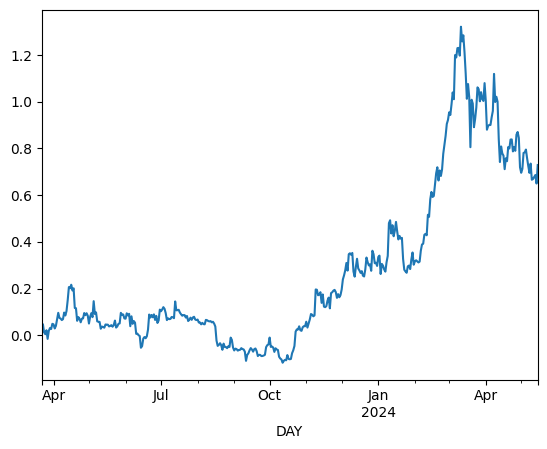

In [39]:
historical_cumulative_return = weighted_daily_returns['cumulative_return']
historical_cumulative_return.plot()

In [40]:
combined_data = pivot_data.merge(pivot_assets, on='DAY', how='left')
combined_data.set_index('DAY', inplace=True)
combined_data

,TOTAL_FILLED_BALANCE_ETH,TOTAL_FILLED_BALANCE_USDC,TOTAL_FILLED_BALANCE_WETH,DAILY_PRICE_ETH,DAILY_PRICE_USDC_x,DAILY_PRICE_WETH_x,TOTAL_VALUE_IN_USD_ETH,TOTAL_VALUE_IN_USD_USDC,TOTAL_VALUE_IN_USD_WETH,COMPOSITION_ETH,...,DAILY_PRICE_RETH,DAILY_PRICE_RPL,DAILY_PRICE_RSR,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_USDC_y,DAILY_PRICE_WBTC,DAILY_PRICE_WETH_y,DAILY_PRICE_WSTETH
DAY,,,,,,,,,,,,,,,,,,,,,
2023-03-22,0.100000,0.000000,0.0000,1743.36,1.000000,1743.36,174.336000,0.000000,0.000000,1.000000,...,1943.193724,41.027989,0.004101,22.885376,0.750757,6.464313,1.010057,28791.601013,1817.378490,2023.790378
2023-03-23,0.140000,0.000000,0.0000,1825.05,1.000000,1825.05,255.507000,0.000000,0.000000,1.000000,...,1978.132073,40.578442,0.004150,26.028662,0.714423,6.448413,1.011716,28754.493594,1846.091458,2058.390353
2023-03-24,0.437000,0.000000,0.0000,1765.28,1.010000,1765.28,771.427360,0.000000,0.000000,1.000000,...,1952.633363,40.343656,0.004183,22.130990,0.718028,6.314177,1.008786,28510.610009,1824.260370,2032.886739
2023-03-25,0.437000,0.000000,0.0000,1750.66,1.010000,1750.66,765.038420,0.000000,0.000000,1.000000,...,1893.528757,38.857283,0.004009,21.123700,0.665835,6.008362,1.008728,27881.394353,1766.906936,1968.846231
2023-03-26,0.447000,0.000000,0.0000,1780.12,0.999827,1780.12,795.713640,0.000000,0.000000,1.000000,...,1924.050865,42.375331,0.003943,21.123650,0.662433,5.870104,1.008116,28280.352719,1799.517247,2006.394028
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-11,11.047240,270.659535,0.0019,2915.79,1.000000,2915.79,32211.431920,270.659535,5.540001,0.991498,...,3309.780000,19.943720,0.006277,146.651336,0.471411,7.239606,1.002948,61185.560690,2930.035799,3411.258922
2024-05-12,11.062640,270.659535,0.0019,2930.86,0.999977,2930.86,32423.049070,270.653310,5.568634,0.991553,...,3309.780000,20.030356,0.006123,147.294545,0.474363,7.290859,1.006226,61564.660776,2939.841565,3426.778054
2024-05-13,11.090865,270.659535,0.0019,2946.31,0.999938,2946.31,32677.126458,270.642754,5.597989,0.991617,...,3298.731671,20.320640,0.006233,149.971232,0.468995,7.218998,1.029494,63051.233477,2978.008867,3471.846182


In [41]:
portfolio = combined_data[[col for col in combined_data.columns if 'COMPOSITION_' in col]]
asset_prices = combined_data[[col for col in combined_data.columns if 'DAILY_PRICE_' in col]]
print(portfolio)
print(asset_prices)

            COMPOSITION_ETH  COMPOSITION_USDC  COMPOSITION_WETH
DAY                                                            
2023-03-22         1.000000          0.000000          0.000000
2023-03-23         1.000000          0.000000          0.000000
2023-03-24         1.000000          0.000000          0.000000
2023-03-25         1.000000          0.000000          0.000000
2023-03-26         1.000000          0.000000          0.000000
...                     ...               ...               ...
2024-05-11         0.991498          0.008331          0.000171
2024-05-12         0.991553          0.008277          0.000170
2024-05-13         0.991617          0.008213          0.000170
2024-05-14         0.991463          0.008368          0.000169
2024-05-15         0.991920          0.007912          0.000168

[421 rows x 3 columns]
            DAILY_PRICE_ETH  DAILY_PRICE_USDC_x  DAILY_PRICE_WETH_x  \
DAY                                                                   
20

## MVO Rebalancing

In [42]:
panama_dao_start_date = panamadao_returns['DAY'].iloc[0]
panama_dao_start_date

Timestamp('2023-03-22 00:00:00')

In [43]:
combined_all_assets

,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,DAILY_PRICE_ENS,...,COMPOSITION_STG,COMPOSITION_BAL,COMPOSITION_RPL,COMPOSITION_SOL,COMPOSITION_MKR,COMPOSITION_ARB,COMPOSITION_CWBTC,COMPOSITION_DPI,COMPOSITION_REN,COMPOSITION_MPL
DAY,,,,,,,,,,,,,,,,,,,,,
2023-01-22,89.229891,0.006462,7.091551,0.027577,0.014806,77.805422,53.171666,463.184016,86.044910,15.040093,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-01-23,87.993423,0.006462,7.049982,0.027577,0.017209,77.805422,53.748008,465.045274,85.159956,15.217766,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-01-24,88.413674,0.006462,7.049390,0.027577,0.017558,77.805422,53.245861,465.620190,85.054341,15.122363,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-01-25,86.696939,0.006462,6.901535,0.027577,0.016392,77.805422,51.354143,473.396814,81.843666,14.732804,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-01-26,89.306431,0.006462,7.041247,0.027577,0.016868,77.805422,54.953221,468.150264,83.765201,15.423502,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-11,84.353048,1.007766,3.449942,0.023292,0.027483,58.929717,54.356222,1228.786830,96.341420,14.196615,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-05-12,83.737894,1.008633,3.441141,0.023323,0.027120,59.086085,55.686127,1237.066091,97.804624,14.055241,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-05-13,85.203764,0.999418,3.473348,0.023323,0.025813,59.871260,57.581433,1266.599091,97.481665,14.052114,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [44]:
combined_all_assets['COMPOSITION_ETH']

DAY
2023-01-22         NaN
2023-01-23         NaN
2023-01-24         NaN
2023-01-25         NaN
2023-01-26         NaN
                ...   
2024-05-11    0.991498
2024-05-12    0.991553
2024-05-13    0.991617
2024-05-14    0.991463
2024-05-15    0.991920
Name: COMPOSITION_ETH, Length: 480, dtype: float64

In [45]:
all_assets = assets['SYMBOL'].unique()

start_data = combined_all_assets[combined_all_assets.index >= panama_dao_start_date]
composition_columns = [f'COMPOSITION_{asset}' for asset in all_assets]
starting_composition = start_data[composition_columns]


In [46]:
pivot_data_filtered.columns

Index(['DAILY_PRICE_ETH', 'DAILY_PRICE_USDC', 'DAILY_PRICE_WETH',
       'COMPOSITION_ETH', 'COMPOSITION_USDC', 'COMPOSITION_WETH'],
      dtype='object')

In [47]:
panama_dao_assets

array(['ETH', 'USDC', 'WETH'], dtype=object)

In [48]:
full_starting_composition = starting_composition.merge(pivot_data_filtered['COMPOSITION_ETH'], left_index=True, right_index=True)

In [49]:
full_starting_composition[['COMPOSITION_ETH', 'COMPOSITION_USDC', 'COMPOSITION_WETH']]

,COMPOSITION_ETH,COMPOSITION_USDC,COMPOSITION_WETH
DAY,,,
2023-03-22,1.000000,0.000000,0.000000
2023-03-23,1.000000,0.000000,0.000000
2023-03-24,1.000000,0.000000,0.000000
2023-03-25,1.000000,0.000000,0.000000
2023-03-26,1.000000,0.000000,0.000000
...,...,...,...
2024-05-11,0.991498,0.008331,0.000171
2024-05-12,0.991553,0.008277,0.000170
2024-05-13,0.991617,0.008213,0.000170


In [50]:

print('all assets', all_assets)
print('panamadao assets', panama_dao_assets)

# Combine both arrays using np.concatenate and remove duplicates using np.unique
combined_assets = np.unique(np.concatenate((all_assets, panama_dao_assets)))

print('combined assets', combined_assets)
print('panamadao assets', panama_dao_assets)


all assets ['CDAI' 'HOP' 'COMP' 'USDC' 'RETH' 'G' 'GFI' 'WETH' 'WBTC' 'AAVE' 'FRAX'
 'CELR' 'WSTETH' 'CETH' 'PAXG' 'ENS' 'UNI' 'RSR' 'STG' 'BAL' 'RPL' 'SOL'
 'MKR' 'ARB' 'CWBTC' 'DPI' 'REN' 'MPL']
panamadao assets ['ETH' 'USDC' 'WETH']
combined assets ['AAVE' 'ARB' 'BAL' 'CDAI' 'CELR' 'CETH' 'COMP' 'CWBTC' 'DPI' 'ENS' 'ETH'
 'FRAX' 'G' 'GFI' 'HOP' 'MKR' 'MPL' 'PAXG' 'REN' 'RETH' 'RPL' 'RSR' 'SOL'
 'STG' 'UNI' 'USDC' 'WBTC' 'WETH' 'WSTETH']
panamadao assets ['ETH' 'USDC' 'WETH']


In [51]:
combined_all_assets['DAILY_PRICE_USDC'] = combined_all_assets['DAILY_PRICE_USDC'].clip(upper=1.15).apply(lambda x: 1 if x > 1 else x)

In [52]:
combined_all_assets['DAILY_PRICE_USDC'].describe()

count    480.000000
mean       0.999934
std        0.001314
min        0.971359
25%        1.000000
50%        1.000000
75%        1.000000
max        1.000000
Name: DAILY_PRICE_USDC, dtype: float64

In [53]:
combined_all_assets['DAILY_PRICE_ETH'] = combined_all_assets['DAILY_PRICE_WETH']

In [54]:
prices_all_assets = combined_all_assets[[f'DAILY_PRICE_{asset}' for asset in combined_assets]]
prices_all_assets.pct_change().describe()

,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,DAILY_PRICE_ENS,...,DAILY_PRICE_RETH,DAILY_PRICE_RPL,DAILY_PRICE_RSR,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_USDC,DAILY_PRICE_WBTC,DAILY_PRICE_WETH,DAILY_PRICE_WSTETH
count,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,...,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000
mean,0.000648,1.624757,-0.001083,-0.000310,0.002248,-0.000359,0.001107,0.002422,0.000779,0.000944,...,0.001637,-0.000277,0.002535,0.005592,0.000179,0.001805,0.000002,0.002437,0.001506,0.001625
std,0.038324,35.595633,0.028091,0.007539,0.045540,0.017007,0.045209,0.021157,0.032985,0.046689,...,0.024812,0.042725,0.060083,0.061781,0.047008,0.059160,0.001794,0.022141,0.022518,0.022731
min,-0.166746,-0.696357,-0.136084,-0.164174,-0.217344,-0.263817,-0.172645,-0.069465,-0.151386,-0.240631,...,-0.181900,-0.171851,-0.227425,-0.479572,-0.204118,-0.402576,-0.025678,-0.078086,-0.071239,-0.074327
25%,-0.019794,-0.018929,-0.013571,0.000000,-0.018536,0.000000,-0.018977,-0.005241,-0.015798,-0.018881,...,-0.007874,-0.022522,-0.020726,-0.021019,-0.021857,-0.020583,0.000000,-0.006851,-0.008757,-0.008198
50%,0.000419,0.000000,-0.000053,0.000000,0.000418,0.000000,-0.000503,0.000000,0.001413,-0.000839,...,-0.000226,-0.003977,0.000577,-0.000416,-0.002013,0.000439,0.000000,0.000156,-0.000553,-0.000711
75%,0.019192,0.014773,0.013131,0.000000,0.021928,0.000000,0.019485,0.007747,0.018697,0.017186,...,0.010539,0.012465,0.022459,0.027347,0.020456,0.020102,0.000000,0.010061,0.011792,0.011512
max,0.303463,779.046055,0.113927,0.006552,0.248469,0.084739,0.355099,0.109533,0.164077,0.379695,...,0.131105,0.230201,0.522604,0.806360,0.290171,0.530659,0.029486,0.133399,0.084998,0.086738


In [55]:
assets_to_drop = ['G', 'HOP','CELR','CDAI','CETH','REN','STG','AAVE','FRAX','MPL','RSR','BAL','ARB','ENS']
mvo_combined_assets = np.array([asset for asset in combined_assets if asset not in assets_to_drop])

mvo_combined_assets

array(['COMP', 'CWBTC', 'DPI', 'ETH', 'GFI', 'MKR', 'PAXG', 'RETH', 'RPL',
       'SOL', 'UNI', 'USDC', 'WBTC', 'WETH', 'WSTETH'], dtype='<U6')

In [56]:
iniital_composition = full_starting_composition.iloc[0]
latest_composition = full_starting_composition.iloc[-1]

<Axes: ylabel='2024-05-15 00:00:00'>

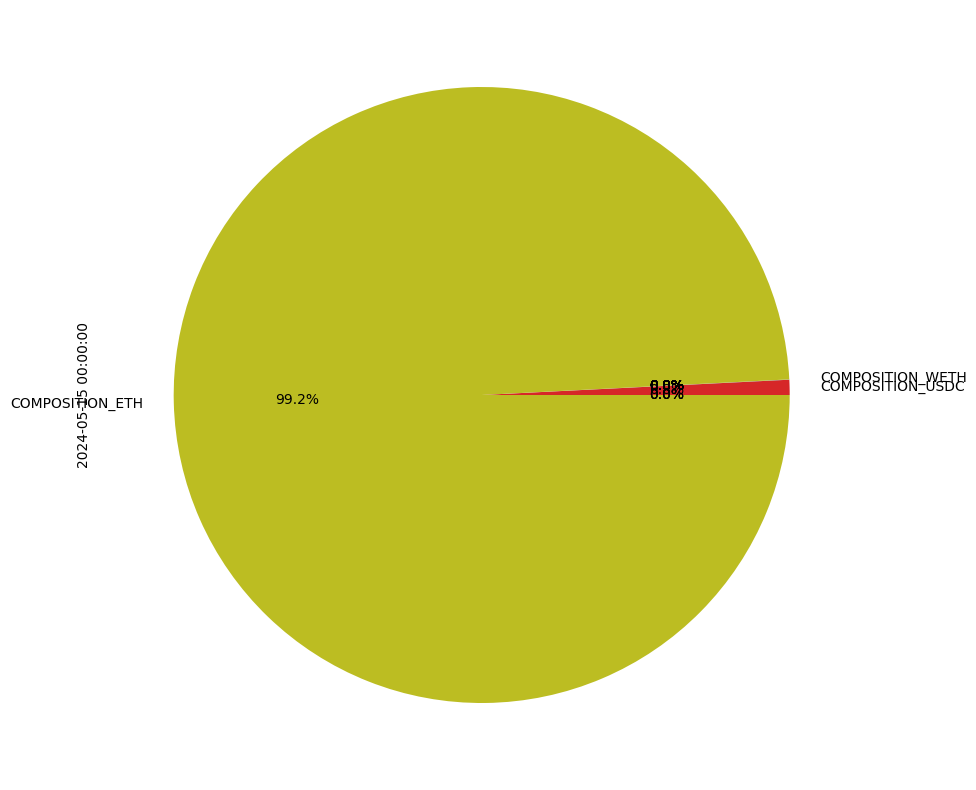

In [57]:
latest_composition.plot.pie(figsize=(10, 10), autopct='%1.1f%%')

<Axes: ylabel='2023-03-22 00:00:00'>

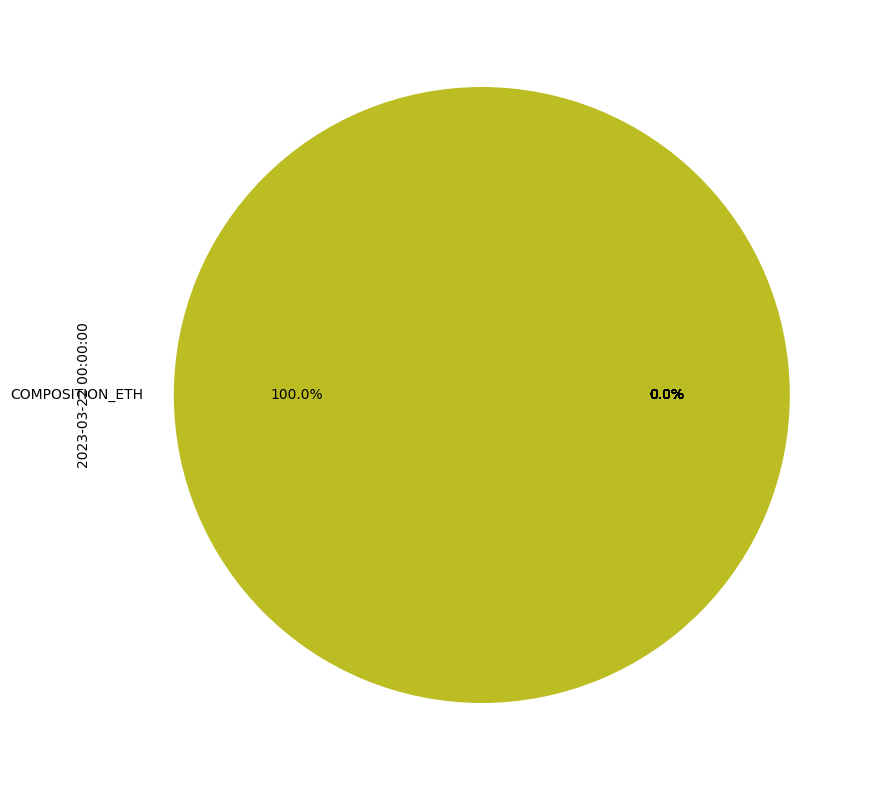

In [58]:
iniital_composition.plot.pie(figsize=(10, 10), autopct='%1.1f%%')

In [59]:
from notebook.services.config import ConfigManager
cm = ConfigManager()
cm.update('notebook', {
    'NotebookApp': {
        'iopub_data_rate_limit': 10000000
    }
})


{'NotebookApp': {'iopub_data_rate_limit': 10000000}}

In [60]:
starting_row = combined_all_assets[combined_all_assets.index >= panama_dao_start_date].iloc[0]

In [61]:
starting_row[[f'COMPOSITION_{asset}' for asset in mvo_combined_assets]]

COMPOSITION_COMP      0.0
COMPOSITION_CWBTC     0.0
COMPOSITION_DPI       0.0
COMPOSITION_ETH       1.0
COMPOSITION_GFI       0.0
COMPOSITION_MKR       0.0
COMPOSITION_PAXG      0.0
COMPOSITION_RETH      0.0
COMPOSITION_RPL       0.0
COMPOSITION_SOL       0.0
COMPOSITION_UNI       0.0
COMPOSITION_USDC      0.0
COMPOSITION_WBTC      0.0
COMPOSITION_WETH      0.0
COMPOSITION_WSTETH    0.0
Name: 2023-03-22 00:00:00, dtype: float64

In [62]:
import cvxpy as cp
import numpy as np
import pandas as pd

threshold = 1e-5  # Define a very small threshold for significant changes in weights

def calculate_sortino_ratio(returns, risk_free=current_risk_free):
    print("from", returns.index.min())
    print('through', returns.index.max())
    print('returns', returns.tail())
    # Calculate daily risk-free rate
    daily_risk_free_rate = (1 + risk_free) ** (1/365) - 1

    # Calculate excess returns
    excess_returns = returns - daily_risk_free_rate

    # Calculate downside returns
    downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
    daily_downside_deviation = np.sqrt(downside_returns.mean())

    # Handle NaN downside risk
    if np.isnan(daily_downside_deviation):
        daily_downside_deviation = 0.0

    # Compounding returns and annualizing based on the actual days with data
    active_days = returns.notna().sum()  # Using actual days with returns
    annual_factor = 365 / active_days
    compounding_return = (1 + excess_returns).prod() ** annual_factor - 1

    # Annual downside deviation
    annual_downside_deviation = daily_downside_deviation * np.sqrt(365)

    # Calculate Sortino ratios
    sortino_ratio = compounding_return / annual_downside_deviation if annual_downside_deviation != 0 else 0.0
    print('sortino ratio', sortino_ratio)

    return sortino_ratio

def mvo_sortino(returns, sortino_ratios, eth_index):
    n = returns.shape[1]
    weights = cp.Variable(n)
    portfolio_return = returns @ weights
    sortino_matrix = np.tile(sortino_ratios.values.reshape(1, -1), (len(returns), 1))
    portfolio_risk = cp.norm(returns - cp.multiply(sortino_matrix, cp.reshape(weights, (1, n))), 'fro')
    objective = cp.Maximize(cp.sum(portfolio_return))
    
    # Set constraints
    constraints = [
        cp.sum(weights) == 1,
        weights >= 0,
        weights <= 0.3
    ]
    
    # Ensure at least 20% allocation to ETH
    constraints.append(weights[eth_index] >= 0.2)
    
    problem = cp.Problem(objective, constraints)
    problem.solve(solver=cp.CLARABEL)
    return weights.value

def rebalance_portfolio(data, weights):
    compositions = np.outer(np.ones(len(data)), weights)
    return compositions

def calculate_daily_portfolio_returns(data, all_assets):
    log_returns = np.log(data[[f'DAILY_PRICE_{asset}' for asset in all_assets]].pct_change().dropna() + 1)
    composition_columns = [f'COMPOSITION_{asset}' for asset in all_assets]
    log_returns.columns = composition_columns
    daily_portfolio_returns = (log_returns * data[composition_columns].shift(1).fillna(0)).sum(axis=1)
    return daily_portfolio_returns

def calculate_cumulative_return(daily_portfolio_returns, start_date):
    daily_portfolio_returns = daily_portfolio_returns[daily_portfolio_returns.index >= start_date]
    cumulative_return = np.exp(np.log1p(daily_portfolio_returns).cumsum()) - 1
    return cumulative_return

def rebalance(data, all_assets, rebalancing_frequency=7):
    data = data.sort_index()
    rebalanced_data = data.copy()
    
    initial_composition = rebalanced_data[rebalanced_data.index >= panama_dao_start_date].iloc[0][[f'COMPOSITION_{asset}' for asset in all_assets]].values
    current_composition = initial_composition.copy()

    start_date = panama_dao_start_date

    # Find the index of the start date in the data
    start_index = data.index.get_loc(start_date)

    # Find the index of ETH in the all_assets array
    eth_index = np.where(all_assets == 'ETH')[0][0]

    for start in range(start_index, len(data)):
        end = start + 1
        period_data = data[start:end]
        
        if start % rebalancing_frequency == 0 and start != start_index:
            historical_returns = np.log(data[:start][[f'DAILY_PRICE_{asset}' for asset in all_assets]].pct_change().dropna() + 1)

            if historical_returns.shape[0] == 0 or historical_returns.shape[1] == 0:
                print(f"No returns available for historical period up to {start}")
                continue

            sortino_ratios = historical_returns.apply(calculate_sortino_ratio)

            if sortino_ratios.isnull().any():
                print(f"Sortino ratios contain NaN for historical period up to {start}")
                continue

            optimal_weights = mvo_sortino(historical_returns.values, sortino_ratios, eth_index)

            # Convert weights to standard notation for readability
            current_composition = np.round(current_composition, decimals=10)
            optimal_weights = np.round(optimal_weights, decimals=10)

            # Apply threshold to significant changes only
            weight_changes = np.abs(current_composition - optimal_weights)
            significant_changes = weight_changes >= threshold

            print(f"Period {start} to {end}:")
            print(f"  Current composition: {[f'{weight:.10f}' for weight in current_composition]}")
            print(f"  Optimal weights: {[f'{weight:.10f}' for weight in optimal_weights]}")
            print(f"  Weight changes: {[f'{change:.10f}' for change in weight_changes]}")


            if np.any(significant_changes):
                current_composition[significant_changes] = optimal_weights[significant_changes]

                # Normalize weights to ensure they sum to 1
                current_composition /= current_composition.sum()

        else:
            # Apply price changes to the current composition
            current_prices = data.iloc[start][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
            previous_prices = data.iloc[start-1][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
            log_returns = np.log(current_prices / previous_prices)
            current_composition = (current_composition * np.exp(log_returns))
            print('current_comp w/ price change', current_composition)
            current_composition /= current_composition.sum()
            print('normalized current_comp w/ price change', current_composition)

        rebalanced_data.loc[period_data.index, [f'COMPOSITION_{asset}' for asset in all_assets]] = current_composition
    
    rebalanced_data = rebalanced_data.iloc[:-1]
    
    return rebalanced_data

# Assuming combined_all_assets is already loaded and processed
all_assets = mvo_combined_assets

# Set rebalancing frequency (e.g., 1 for daily, 7 for weekly, 30 for monthly)
rebalancing_frequency = 1  # Change this to the desired frequency

# Perform rebalancing using MVO with Sortino ratio target
rebalanced_data = rebalance(combined_all_assets, all_assets, rebalancing_frequency)

# Calculate daily portfolio returns with rebalancing costs
mvo_daily_portfolio_returns = calculate_daily_portfolio_returns(rebalanced_data, all_assets)

# Calculate cumulative return for the rebalanced data from the panama_dao_start_date
cumulative_return = calculate_cumulative_return(mvo_daily_portfolio_returns, panama_dao_start_date)

# Print the first few rows of the rebalanced data and cumulative return to verify
print(rebalanced_data.head())
print(rebalanced_data.tail())

# Prepare base return
base_return = cumulative_return.reset_index()
base_return.columns = ['DAY', 'base_cumulative_return']

# Normalize returns
first_value = base_return['base_cumulative_return'].iloc[0]
base_return['PanamaDAO_treasury_return'] = 100 + (100 * (base_return['base_cumulative_return'] - first_value))

# Final output
normalized_returns = base_return[['DAY', 'PanamaDAO_treasury_return']]
normalized_returns.set_index('DAY', inplace=True)

# Print the first few rows of normalized returns
print(normalized_returns.head())


current_comp w/ price change [0.         0.         0.         0.99298123 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
normalized current_comp w/ price change [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
from 2023-01-23 00:00:00
through 2023-03-22 00:00:00
returns DAY
2023-03-18    0.033332
2023-03-19   -0.012332
2023-03-20   -0.013290
2023-03-21   -0.019488
2023-03-22   -0.000103
Name: DAILY_PRICE_COMP, dtype: float64
sortino ratio -1.2169211135042945
from 2023-01-23 00:00:00
through 2023-03-22 00:00:00
returns DAY
2023-03-18    0.001147
2023-03-19    0.023845
2023-03-20    0.002338
2023-03-21    0.001058
2023-03-22    0.009829
Name: DAILY_PRICE_CWBTC, dtype: float64
sortino ratio 6.822307608430796
from 2023-01-23 00:00:00
through 2023-03-22 00:00:00
returns DAY
2023-03-18    0.047730
2023-03-19   -0.020918
2023-03-20   -0.003690
2023-03-21   -0.013031
2023-03-22   -0.001181
Name: DAILY_PRICE_DPI, dtype: float64
sortino 

In [63]:
rebalanced_data
# Define a threshold
threshold = 1e-5

# Replace values below the threshold with 0
cleaned_rebalanced_data = rebalanced_data.applymap(lambda x: 0 if abs(x) < threshold else x)
cleaned_rebalanced_data

C:\Users\brand\AppData\Local\Temp\ipykernel_11560\1339587447.py:6: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  cleaned_rebalanced_data = rebalanced_data.applymap(lambda x: 0 if abs(x) < threshold else x)


,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,DAILY_PRICE_ENS,...,COMPOSITION_BAL,COMPOSITION_RPL,COMPOSITION_SOL,COMPOSITION_MKR,COMPOSITION_ARB,COMPOSITION_CWBTC,COMPOSITION_DPI,COMPOSITION_REN,COMPOSITION_MPL,DAILY_PRICE_ETH
DAY,,,,,,,,,,,,,,,,,,,,,
2023-01-22,89.229891,0.006462,7.091551,0.027577,0.014806,77.805422,53.171666,463.184016,86.044910,15.040093,...,0,0.0,0.0,0.0,0,0.0,0,0,0,1657.228155
2023-01-23,87.993423,0.006462,7.049982,0.027577,0.017209,77.805422,53.748008,465.045274,85.159956,15.217766,...,0,0.0,0.0,0.0,0,0.0,0,0,0,1640.164570
2023-01-24,88.413674,0.006462,7.049390,0.027577,0.017558,77.805422,53.245861,465.620190,85.054341,15.122363,...,0,0.0,0.0,0.0,0,0.0,0,0,0,1639.347371
2023-01-25,86.696939,0.006462,6.901535,0.027577,0.016392,77.805422,51.354143,473.396814,81.843666,14.732804,...,0,0.0,0.0,0.0,0,0.0,0,0,0,1601.404300
2023-01-26,89.306431,0.006462,7.041247,0.027577,0.016868,77.805422,54.953221,468.150264,83.765201,15.423502,...,0,0.0,0.0,0.0,0,0.0,0,0,0,1621.049554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-10,90.549157,1.050244,3.614600,0.023315,0.028382,61.361606,58.618193,1272.397406,98.220946,14.717558,...,0,0.0,0.3,0.2,0,0.0,0,0,0,3049.713552
2024-05-11,84.353048,1.007766,3.449942,0.023292,0.027483,58.929717,54.356222,1228.786830,96.341420,14.196615,...,0,0.0,0.3,0.2,0,0.0,0,0,0,2930.035799
2024-05-12,83.737894,1.008633,3.441141,0.023323,0.027120,59.086085,55.686127,1237.066091,97.804624,14.055241,...,0,0.0,0.3,0.2,0,0.0,0,0,0,2939.841565


In [64]:
mvo_daily_portfolio_returns

DAY
2023-01-22    0.000000
2023-01-23    0.000000
2023-01-24    0.000000
2023-01-25    0.000000
2023-01-26    0.000000
                ...   
2024-05-10    0.040009
2024-05-11   -0.031062
2024-05-12    0.003117
2024-05-13   -0.000661
2024-05-14   -0.013057
Length: 479, dtype: float64

In [65]:
mvo_daily_portfolio_returns = mvo_daily_portfolio_returns[mvo_daily_portfolio_returns.index >= panama_dao_start_date]

In [66]:
mvo_daily_portfolio_returns.max()

0.09281317422630386

In [67]:
sortino(mvo_daily_portfolio_returns)

Sortino Ratio: 1.770048123155107


1.770048123155107

Cumulative Return:
 DAY
2023-03-22    0.000000
2023-03-23    0.015676
2023-03-24    0.007056
2023-03-25   -0.019413
2023-03-26    0.009500
dtype: float64
Cumulative Return:
 DAY
2024-05-10    1.159876
2024-05-11    1.092786
2024-05-12    1.099310
2024-05-13    1.097923
2024-05-14    1.070531
dtype: float64


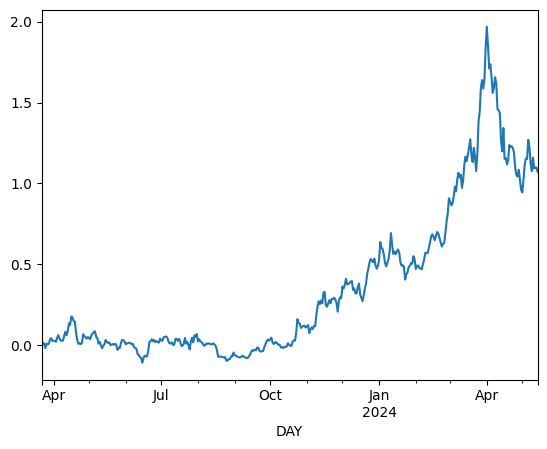

In [68]:
print("Cumulative Return:\n", cumulative_return.head())
print("Cumulative Return:\n", cumulative_return.tail())
cumulative_return.plot()

mvo_cumulative_return = cumulative_return.copy()

Normalized Returns:
             PanamaDAO_treasury_return
DAY                                  
2023-03-22                 100.000000
2023-03-23                 101.567561
2023-03-24                 100.705644
2023-03-25                  98.058745
2023-03-26                 100.950045
Normalized Returns:
             PanamaDAO_treasury_return
DAY                                  
2024-05-10                 215.987599
2024-05-11                 209.278592
2024-05-12                 209.930988
2024-05-13                 209.792284
2024-05-14                 207.053129


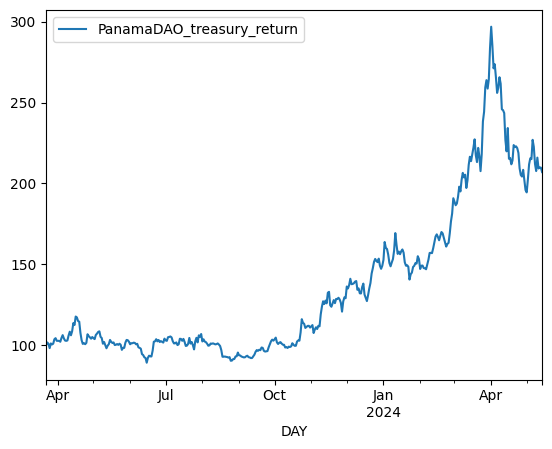

In [69]:
print("Normalized Returns:\n", normalized_returns.head())
print("Normalized Returns:\n", normalized_returns.tail())
normalized_returns.plot()

mvo_normalized_returns = normalized_returns.copy()

In [70]:
composition_columns = [f'COMPOSITION_{asset}' for asset in mvo_combined_assets]
mvo_comp = rebalanced_data[composition_columns]
mvo_comp

,COMPOSITION_COMP,COMPOSITION_CWBTC,COMPOSITION_DPI,COMPOSITION_ETH,COMPOSITION_GFI,COMPOSITION_MKR,COMPOSITION_PAXG,COMPOSITION_RETH,COMPOSITION_RPL,COMPOSITION_SOL,COMPOSITION_UNI,COMPOSITION_USDC,COMPOSITION_WBTC,COMPOSITION_WETH,COMPOSITION_WSTETH
DAY,,,,,,,,,,,,,,,
2023-01-22,0.000000e+00,0.000000e+00,0.0,NaN,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,NaN,0.000000e+00,NaN,0.000000e+00
2023-01-23,0.000000e+00,0.000000e+00,0.0,NaN,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,NaN,0.000000e+00,NaN,0.000000e+00
2023-01-24,0.000000e+00,0.000000e+00,0.0,NaN,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,NaN,0.000000e+00,NaN,0.000000e+00
2023-01-25,0.000000e+00,0.000000e+00,0.0,NaN,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,NaN,0.000000e+00,NaN,0.000000e+00
2023-01-26,0.000000e+00,0.000000e+00,0.0,NaN,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,NaN,0.000000e+00,NaN,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-10,6.200000e-09,2.000000e-10,0.0,0.2,0.3,0.2,0.0,0.0,5.000000e-10,0.3,0.0,0.0,2.000000e-10,0.0,3.900000e-09
2024-05-11,6.200000e-09,2.000000e-10,0.0,0.2,0.3,0.2,0.0,0.0,5.000000e-10,0.3,0.0,0.0,2.000000e-10,0.0,3.900000e-09
2024-05-12,6.200000e-09,2.000000e-10,0.0,0.2,0.3,0.2,0.0,0.0,5.000000e-10,0.3,0.0,0.0,2.000000e-10,0.0,3.900000e-09


In [71]:
# Define a threshold
threshold = 1e-5

# Replace values below the threshold with 0
mvo_comp = mvo_comp.applymap(lambda x: 0 if abs(x) < threshold else x)
mvo_comp

C:\Users\brand\AppData\Local\Temp\ipykernel_11560\1323881994.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mvo_comp = mvo_comp.applymap(lambda x: 0 if abs(x) < threshold else x)


,COMPOSITION_COMP,COMPOSITION_CWBTC,COMPOSITION_DPI,COMPOSITION_ETH,COMPOSITION_GFI,COMPOSITION_MKR,COMPOSITION_PAXG,COMPOSITION_RETH,COMPOSITION_RPL,COMPOSITION_SOL,COMPOSITION_UNI,COMPOSITION_USDC,COMPOSITION_WBTC,COMPOSITION_WETH,COMPOSITION_WSTETH
DAY,,,,,,,,,,,,,,,
2023-01-22,0.0,0.0,0,NaN,0.0,0.0,0,0,0.0,0.0,0,NaN,0.0,NaN,0.0
2023-01-23,0.0,0.0,0,NaN,0.0,0.0,0,0,0.0,0.0,0,NaN,0.0,NaN,0.0
2023-01-24,0.0,0.0,0,NaN,0.0,0.0,0,0,0.0,0.0,0,NaN,0.0,NaN,0.0
2023-01-25,0.0,0.0,0,NaN,0.0,0.0,0,0,0.0,0.0,0,NaN,0.0,NaN,0.0
2023-01-26,0.0,0.0,0,NaN,0.0,0.0,0,0,0.0,0.0,0,NaN,0.0,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-10,0.0,0.0,0,0.2,0.3,0.2,0,0,0.0,0.3,0,0.0,0.0,0.0,0.0
2024-05-11,0.0,0.0,0,0.2,0.3,0.2,0,0,0.0,0.3,0,0.0,0.0,0.0,0.0
2024-05-12,0.0,0.0,0,0.2,0.3,0.2,0,0,0.0,0.3,0,0.0,0.0,0.0,0.0


In [72]:
mvo_comp.tail(50)
print(mvo_comp.columns)

Index(['COMPOSITION_COMP', 'COMPOSITION_CWBTC', 'COMPOSITION_DPI',
       'COMPOSITION_ETH', 'COMPOSITION_GFI', 'COMPOSITION_MKR',
       'COMPOSITION_PAXG', 'COMPOSITION_RETH', 'COMPOSITION_RPL',
       'COMPOSITION_SOL', 'COMPOSITION_UNI', 'COMPOSITION_USDC',
       'COMPOSITION_WBTC', 'COMPOSITION_WETH', 'COMPOSITION_WSTETH'],
      dtype='object')


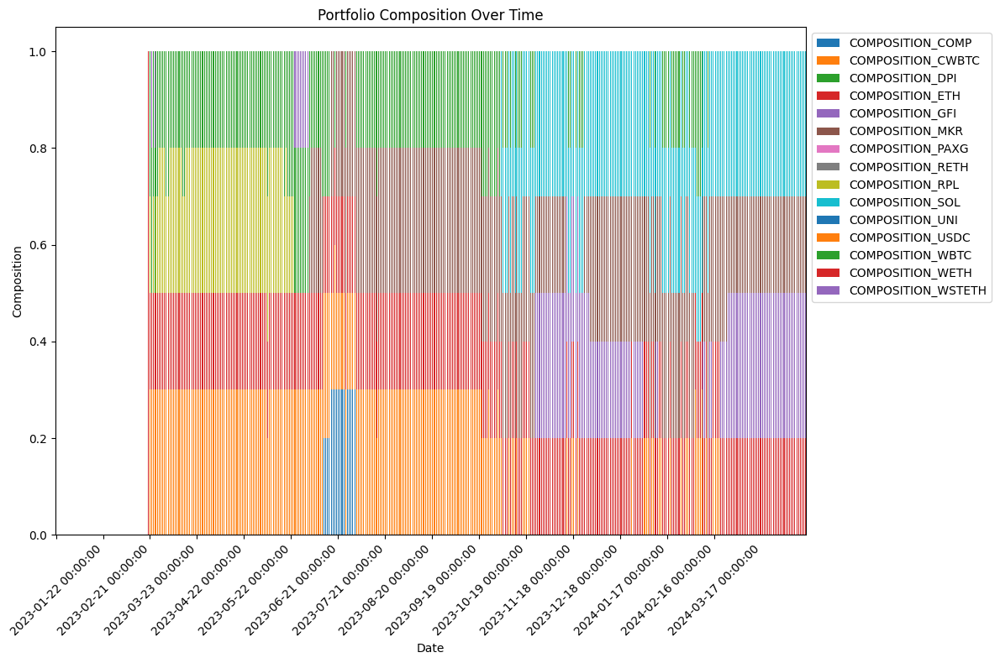

In [73]:
import matplotlib.pyplot as plt
# Plot the latest composition as a bar chart


# Plot the stacked bar chart
# Plot the stacked bar chart
fig, ax = plt.subplots(figsize=(12, 8))

mvo_comp.plot(kind='bar', stacked=True, ax=ax)

# Improve the x-axis labels
plt.title('Portfolio Composition Over Time')
plt.xlabel('Date')
plt.ylabel('Composition')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.xticks(ticks=range(0, len(pivot_data_filtered), 30), rotation=45)  # Show x-axis labels every 30 days
plt.tight_layout()
plt.show()

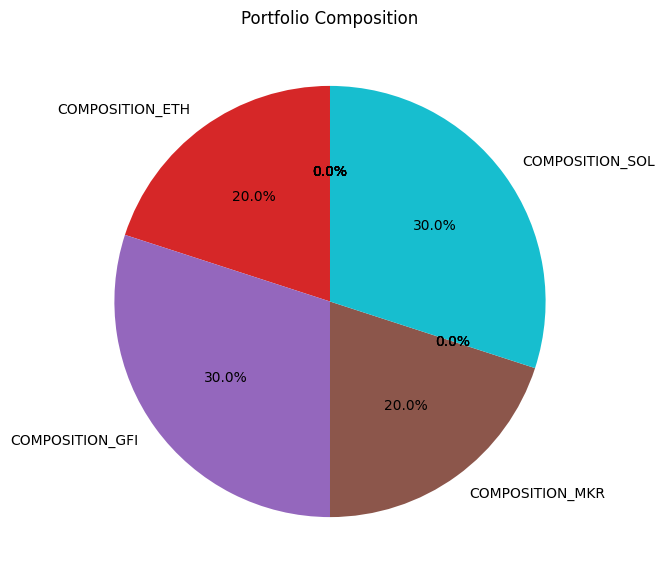

In [74]:
latest_comp_mvo = mvo_comp.iloc[-1]
# Plot the pie chart

def mvo_composition(): 
    plt.figure(figsize=(10, 7))
    latest_comp_mvo.plot.pie(autopct='%1.1f%%', startangle=90)
    plt.title('Portfolio Composition')
    plt.ylabel('')  # Hide the y-label
    return plt.show()
    
mvo_composition()

In [75]:
comp_columns = [col for col in pivot_data_filtered.columns if col.startswith('COMPOSITION_')]


latest_historical_comp = pivot_data_filtered[comp_columns].iloc[-2]

def historical_composition():
    plt.figure(figsize=(10, 7))
    latest_historical_comp.plot.pie(autopct='%1.1f%%', startangle=90)
    plt.title('Portfolio Composition')
    plt.ylabel('')  # Hide the y-label
    return plt.show()



## RL Rebalancing

In [76]:
combined_data1.isna().sum().sum()

0

## Trying all assets, historical sortinos

In [77]:
rl_combined_all_assets = combined_all_assets.fillna(0)

In [78]:
mvo_combined_assets

array(['COMP', 'CWBTC', 'DPI', 'ETH', 'GFI', 'MKR', 'PAXG', 'RETH', 'RPL',
       'SOL', 'UNI', 'USDC', 'WBTC', 'WETH', 'WSTETH'], dtype='<U6')

In [79]:
rl_combined_all_assets.iloc[0][[f'COMPOSITION_{asset}' for asset in combined_assets]]

COMPOSITION_AAVE      0.0
COMPOSITION_ARB       0.0
COMPOSITION_BAL       0.0
COMPOSITION_CDAI      0.0
COMPOSITION_CELR      0.0
COMPOSITION_CETH      0.0
COMPOSITION_COMP      0.0
COMPOSITION_CWBTC     0.0
COMPOSITION_DPI       0.0
COMPOSITION_ENS       0.0
COMPOSITION_ETH       0.0
COMPOSITION_FRAX      0.0
COMPOSITION_G         0.0
COMPOSITION_GFI       0.0
COMPOSITION_HOP       0.0
COMPOSITION_MKR       0.0
COMPOSITION_MPL       0.0
COMPOSITION_PAXG      0.0
COMPOSITION_REN       0.0
COMPOSITION_RETH      0.0
COMPOSITION_RPL       0.0
COMPOSITION_RSR       0.0
COMPOSITION_SOL       0.0
COMPOSITION_STG       0.0
COMPOSITION_UNI       0.0
COMPOSITION_USDC      0.0
COMPOSITION_WBTC      0.0
COMPOSITION_WETH      0.0
COMPOSITION_WSTETH    0.0
Name: 2023-01-22 00:00:00, dtype: float64

In [80]:
rl_combined_all_assets.iloc[0][[f'COMPOSITION_{asset}' for asset in all_assets]].values

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [81]:
prices_input = rl_combined_all_assets[[col for col in rl_combined_all_assets.columns if 'DAILY_PRICE_' in col]]
prices_input

,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,DAILY_PRICE_ENS,...,DAILY_PRICE_RPL,DAILY_PRICE_RSR,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_USDC,DAILY_PRICE_WBTC,DAILY_PRICE_WETH,DAILY_PRICE_WSTETH,DAILY_PRICE_ETH
DAY,,,,,,,,,,,,,,,,,,,,,
2023-01-22,89.229891,0.006462,7.091551,0.027577,0.014806,77.805422,53.171666,463.184016,86.044910,15.040093,...,36.220582,0.004373,25.297558,0.712136,7.116863,1.0,23040.867210,1657.228155,1826.729861,1657.228155
2023-01-23,87.993423,0.006462,7.049982,0.027577,0.017209,77.805422,53.748008,465.045274,85.159956,15.217766,...,36.782880,0.004517,24.793327,0.665175,6.940717,1.0,23018.957794,1640.164570,1808.082328,1640.164570
2023-01-24,88.413674,0.006462,7.049390,0.027577,0.017558,77.805422,53.245861,465.620190,85.054341,15.122363,...,40.436736,0.004716,24.974129,0.732753,6.844909,1.0,23114.151038,1639.347371,1810.382407,1639.347371
2023-01-25,86.696939,0.006462,6.901535,0.027577,0.016392,77.805422,51.354143,473.396814,81.843666,14.732804,...,38.813139,0.004375,24.472066,0.630216,6.676154,1.0,23269.734200,1601.404300,1768.980753,1601.404300
2023-01-26,89.306431,0.006462,7.041247,0.027577,0.016868,77.805422,54.953221,468.150264,83.765201,15.423502,...,40.436324,0.004507,24.861352,0.655578,6.835079,1.0,23285.348813,1621.049554,1790.625369,1621.049554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-11,84.353048,1.007766,3.449942,0.023292,0.027483,58.929717,54.356222,1228.786830,96.341420,14.196615,...,19.943720,0.006277,146.651336,0.471411,7.239606,1.0,61185.560690,2930.035799,3411.258922,2930.035799
2024-05-12,83.737894,1.008633,3.441141,0.023323,0.027120,59.086085,55.686127,1237.066091,97.804624,14.055241,...,20.030356,0.006123,147.294545,0.474363,7.290859,1.0,61564.660776,2939.841565,3426.778054,2939.841565
2024-05-13,85.203764,0.999418,3.473348,0.023323,0.025813,59.871260,57.581433,1266.599091,97.481665,14.052114,...,20.320640,0.006233,149.971232,0.468995,7.218998,1.0,63051.233477,2978.008867,3471.846182,2978.008867


In [82]:
combined_assets

array(['AAVE', 'ARB', 'BAL', 'CDAI', 'CELR', 'CETH', 'COMP', 'CWBTC',
       'DPI', 'ENS', 'ETH', 'FRAX', 'G', 'GFI', 'HOP', 'MKR', 'MPL',
       'PAXG', 'REN', 'RETH', 'RPL', 'RSR', 'SOL', 'STG', 'UNI', 'USDC',
       'WBTC', 'WETH', 'WSTETH'], dtype=object)

## Data Cleaning

In [83]:
# Load the prices data
prices_input = rl_combined_all_assets[[col for col in rl_combined_all_assets.columns if 'DAILY_PRICE_' in col]]

# Calculate daily returns
returns = prices_input.pct_change()

# Describe the returns to understand the distribution
returns_description = returns.describe()
print(returns_description)

# Cap extreme values using a threshold based on standard deviation
def cap_extreme_values(series, threshold=3):
    mean = series.mean()
    std = series.std()
    upper_limit = mean + threshold * std
    lower_limit = mean - threshold * std
    return np.clip(series, lower_limit, upper_limit)

# Apply capping to all columns
capped_returns = returns.apply(cap_extreme_values, axis=0)

# Fill missing values by forward filling
cleaned_returns = capped_returns.fillna(method='ffill')

# Verify there are no NaN values left
#assert not cleaned_returns.isnull().values.any(), "There are still NaN values in the cleaned returns."

# Reconstruct the cleaned prices from the cleaned returns
cleaned_prices = (cleaned_returns + 1).cumprod() * prices_input.iloc[0]

# Verify the cleaned prices
cleaned_prices_description = cleaned_prices.describe()
print(cleaned_prices_description)

# Update the original data with cleaned prices
rl_combined_all_assets_cleaned = rl_combined_all_assets.copy()
for col in prices_input.columns:
    rl_combined_all_assets_cleaned[col] = cleaned_prices[col]

       DAILY_PRICE_AAVE  DAILY_PRICE_ARB  DAILY_PRICE_BAL  DAILY_PRICE_CDAI  \
count        479.000000       479.000000       479.000000        479.000000   
mean           0.000648         1.624757        -0.001083         -0.000310   
std            0.038324        35.595633         0.028091          0.007539   
min           -0.166746        -0.696357        -0.136084         -0.164174   
25%           -0.019794        -0.018929        -0.013571          0.000000   
50%            0.000419         0.000000        -0.000053          0.000000   
75%            0.019192         0.014773         0.013131          0.000000   
max            0.303463       779.046055         0.113927          0.006552   

       DAILY_PRICE_CELR  DAILY_PRICE_CETH  DAILY_PRICE_COMP  \
count        479.000000        479.000000        479.000000   
mean           0.002248         -0.000359          0.001107   
std            0.045540          0.017007          0.045209   
min           -0.217344         -0.2

C:\Users\brand\AppData\Local\Temp\ipykernel_11560\1370136863.py:23: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  cleaned_returns = capped_returns.fillna(method='ffill')


In [84]:
import gym
from gym import spaces
import numpy as np
import pandas as pd
from stable_baselines3 import PPO
from scipy.optimize import minimize, Bounds, LinearConstraint

def mvo(data, annual_risk_free_rate=0.05):
    try:
        portfolio = data[[f'COMPOSITION_{asset}' for asset in all_assets]]
        returns = portfolio.pct_change().fillna(0)
        total_portfolio_value = portfolio.sum(axis=1)
        composition = portfolio.divide(total_portfolio_value, axis=0)

        assert not returns.isnull().values.any(), "Returns contain NaN values"
        assert not np.isinf(returns).values.any(), "Returns contain inf values"

        daily_risk_free_rate = (1 + annual_risk_free_rate) ** (1/365) - 1
        excess_returns = returns - daily_risk_free_rate
        downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
        daily_downside_deviation = np.sqrt(downside_returns.mean())
        active_days = returns.notna().sum().max()
        annual_factor = 365 / active_days
        compounding_return = (1 + excess_returns).prod() ** annual_factor - 1
        annual_downside_deviation = daily_downside_deviation * np.sqrt(365)
        sortino_ratio = compounding_return / annual_downside_deviation

        def sortino_ratio_objective(weights):
            portfolio_returns = np.dot(returns, weights)
            excess_portfolio_returns = portfolio_returns - daily_risk_free_rate
            downside_portfolio_returns = np.where(excess_portfolio_returns < 0, excess_portfolio_returns**2, 0)
            portfolio_downside_deviation = np.sqrt(downside_portfolio_returns.mean())
            annual_portfolio_return = (1 + excess_portfolio_returns).prod() ** (365 / len(excess_portfolio_returns)) - 1
            portfolio_annual_downside_deviation = portfolio_downside_deviation * np.sqrt(365)
            return -annual_portfolio_return / portfolio_annual_downside_deviation

        num_assets = len(all_assets)
        bounds = Bounds([0.01] * num_assets, [0.5] * num_assets)
        constraints = LinearConstraint([1] * num_assets, [1], [1])
        options = {'verbose': 1, 'maxiter': 1000}

        result = minimize(sortino_ratio_objective, composition.mean().values, method='trust-constr',
                          bounds=bounds, constraints=constraints, options=options)

        if result.success:
            optimized_weights = result.x
            return optimized_weights, returns, composition, total_portfolio_value
        else:
            print("Optimization failed:", result.message)
            return None, None, None, None

    except Exception as e:
        print(f"Error during MVO computation: {e}")
        return None, None, None, None

def calculate_sortino_ratio(returns, risk_free=current_risk_free):
    returns = pd.Series(returns)
    daily_risk_free_rate = (1 + risk_free) ** (1/365) - 1

    excess_returns = returns - daily_risk_free_rate
    downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
    daily_downside_deviation = np.sqrt(downside_returns.mean())

    if np.isnan(daily_downside_deviation):
        daily_downside_deviation = 0.0

    active_days = returns.notna().sum()
    annual_factor = 365 / active_days
    compounding_return = (1 + excess_returns).prod() ** annual_factor - 1
    annual_downside_deviation = daily_downside_deviation * np.sqrt(365)

    sortino_ratio = compounding_return / annual_downside_deviation if annual_downside_deviation != 0 else 0.0
    
    if np.isinf(sortino_ratio) or sortino_ratio > 1000:
        sortino_ratio = 0.0
        print("Unusual Sortino ratio detected, setting to 0.0")
        
    print('sortino ratio', sortino_ratio)
    return sortino_ratio

def normalize_portfolio(portfolio):
    total = np.sum(portfolio)
    if total != 0:
        return portfolio / total
    return portfolio

class PortfolioEnv(gym.Env):
    def __init__(self, data, initial_composition, rebalancing_frequency=7, start_date=None):
        super(PortfolioEnv, self).__init__()
        
        self.data = data
        self.num_assets = len(all_assets)
        self.initial_composition = initial_composition
        self.rebalancing_frequency = rebalancing_frequency
        self.start_date = start_date
        self.eth_index = np.where(all_assets == 'ETH')[0][0]

        self.observation_space = spaces.Box(
            low=0, high=np.inf, shape=(2 * self.num_assets,), dtype=np.float32
        )
        
        self.action_space = spaces.Box(low=0, high=1, shape=(self.num_assets,), dtype=np.float32)
        
        self.actions_log = []
        self.returns_log = []
        self.composition_log = []
        self.reset()
    
    def reset(self):
        if self.start_date:
            self.current_step = self.data.index.get_loc(self.start_date)
        else:
            self.current_step = 0
        self.done = False
        self.portfolio = self.initial_composition
        self.actions_log = []
        self.returns_log = []
        self.composition_log = [(self.data.index[self.current_step], self.portfolio.copy())]
        print(f"Environment reset. Initial composition: {self.portfolio}")
        return self._next_observation()
    
    def _next_observation(self):
        prices = self.data.iloc[self.current_step][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
        obs = np.concatenate([self.portfolio, prices])
        print(f'portfolio: {self.portfolio}')
        print(f'prices: {prices}')
        print(f'obs: {obs}')
        return obs

    def step(self, action):
        if self.done or self.current_step >= len(self.data) - 1:
            self.done = True
            return self._next_observation(), 0, self.done, {}

        current_prices = self.data.iloc[self.current_step][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
        prev_prices = self.data.iloc[self.current_step - 1][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values if self.current_step > 0 else current_prices

        print(f"Step {self.current_step}: Applying daily price changes")
        print(f"Previous prices: {prev_prices}")
        print(f"Current prices: {current_prices}")
        print(f"Portfolio before price change: {self.portfolio}")

        # Calculate log returns
        log_returns = np.log(current_prices / prev_prices)
        print(f"Log returns: {log_returns}")

        # Apply log returns to the portfolio
        new_portfolio_values = self.portfolio * np.exp(log_returns)
        sum_new_portfolio_values = np.sum(new_portfolio_values)
        print('new portfolio value', new_portfolio_values)
        print('sum of new port values', sum_new_portfolio_values)

        if sum_new_portfolio_values != 0:
            self.portfolio = new_portfolio_values / sum_new_portfolio_values
        else:
            self.portfolio = new_portfolio_values

        self.portfolio = normalize_portfolio(new_portfolio_values)
        print(f"Portfolio after price change: {self.portfolio}")

        if self.current_step % self.rebalancing_frequency == 0:
            action = np.clip(action, 0, 1)
            action_sum = np.sum(action)
            if action_sum == 0:
                action_sum = 1e-8

            action = action / action_sum
            print(f"Rebalancing step: {self.current_step}")
            print(f"Action taken: {action}")
            print(f"Portfolio before rebalancing: {self.portfolio}")

            self.portfolio = action
            self.actions_log.append((self.data.index[self.current_step], action))
            print(f"Portfolio after rebalancing: {self.portfolio}")

            if self.portfolio[self.eth_index] < 0.2:
                diff = 0.2 - self.portfolio[self.eth_index]
                remaining_allocation = 1 - 0.2

                self.portfolio[self.eth_index] = 0.2
                other_weights = np.delete(self.portfolio, self.eth_index)
                other_weights = other_weights / np.sum(other_weights) * remaining_allocation
                self.portfolio = np.insert(other_weights, self.eth_index, 0.2)

            print(f"Portfolio after enforcing ETH constraint: {self.portfolio}")

            self.portfolio = normalize_portfolio(self.portfolio)
            print(f"Normalized portfolio: {self.portfolio}")

        self.composition_log.append((self.data.index[self.current_step], self.portfolio.copy()))

        portfolio_return = np.sum(log_returns * self.portfolio)
        print('portfolio return', portfolio_return)

        self.returns_log.append((self.data.index[self.current_step], portfolio_return))

        if len(self.returns_log) > 2:
            sortino_ratio = calculate_sortino_ratio([r for _, r in self.returns_log])
            print('returns array', [r for _, r in self.returns_log])
        else:
            sortino_ratio = 0

        optimized_weights, _, composition, _ = mvo(self.data.iloc[:self.current_step + 1])
        print('input for mvo', self.data.iloc[:self.current_step + 1])
        if optimized_weights is not None:
            current_weights = composition.iloc[-1].values
            max_distance = sum(abs(1 - value) for value in optimized_weights)
            distance_penalty = sum(abs(current_weights[i] - optimized_weights[i]) for i in range(len(optimized_weights))) / max_distance if max_distance != 0 else 0
        else:
            distance_penalty = 0

        print(f"Step: {self.current_step}, Action: {action}, Portfolio Return: {portfolio_return}, Sortino Ratio: {sortino_ratio}, Distance Penalty: {distance_penalty}")
        # 
        reward = portfolio_return + 30 * sortino_ratio - distance_penalty 
        print('sortino ratio', sortino_ratio)
        print('reward', reward)
        obs = self._next_observation()
        self.current_step += 1
        return obs, reward, self.done, {}

def train_rl_agent(data, all_assets, rebalancing_frequency=7, start_date=None):
    initial_composition = data.loc[data.index >= start_date][[f'COMPOSITION_{asset}' for asset in all_assets]].to_numpy()[0]
    env = PortfolioEnv(data, initial_composition, rebalancing_frequency=rebalancing_frequency, start_date=start_date)
    model = PPO('MlpPolicy', env, verbose=1)
    
    total_timesteps = len(data)
    training_duration_factor = 500
    total_timesteps *= training_duration_factor

    obs = env.reset()
    for _ in range(total_timesteps):
        action, _ = model.predict(obs)
        obs, rewards, done, info = env.step(action)
        if done:
            break

    actions_log = env.actions_log
    returns_log = env.returns_log
    composition_log = env.composition_log

    actions_df = pd.DataFrame([x[1] for x in actions_log], columns=[f'WEIGHT_{asset}' for asset in all_assets])
    actions_df.index = [x[0] for x in actions_log]

    composition_df = pd.DataFrame([x[1] for x in composition_log], columns=[f'COMPOSITION_{asset}' for asset in all_assets])
    composition_df.index = [x[0] for x in composition_log]

    returns_df = pd.DataFrame([x[1] for x in returns_log], columns=['Portfolio Return'])
    returns_df.index = [x[0] for x in returns_log]

    prices_df = data.loc[data.index >= start_date, [f'DAILY_PRICE_{asset}' for asset in all_assets]]
    price_returns = prices_df.pct_change().fillna(0)
    portfolio_values = (composition_df.values * price_returns.values).sum(axis=1)
    rl_portfolio_returns = returns_df
    rl_cumulative_return = (1 + rl_portfolio_returns).cumprod() - 1

    cumulative_return_df = rl_cumulative_return.reset_index()
    cumulative_return_df.columns = ['DAY', 'cumulative_return']

    base_return = cumulative_return_df.dropna().rename(columns={'cumulative_return': 'base_cumulative_return'})

    combined = base_return[['DAY', 'base_cumulative_return']].sort_values('DAY')

    first_value = combined['base_cumulative_return'].iloc[0]
    combined['PanamaDAO_treasury_return'] = 100 + (100 * (combined['base_cumulative_return'] - first_value))

    rl_normalized_returns = combined[['DAY', 'PanamaDAO_treasury_return']]

    return actions_df, rl_portfolio_returns, rl_cumulative_return, rl_normalized_returns, composition_df, returns_df

# Usage example
rebalancing_frequency = 7

all_assets = mvo_combined_assets

start_date = panama_dao_start_date

actions_df, rl_portfolio_returns, rl_cumulative_return, rl_normalized_returns, composition_df, returns_df = train_rl_agent(rl_combined_all_assets, all_assets, rebalancing_frequency, start_date)

print(rl_normalized_returns.head())
print(returns_df.head())


Environment reset. Initial composition: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
portfolio: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
prices: [4.57074084e+01 5.78460823e+02 8.44572105e+01 1.81737849e+03
 6.64014159e-01 6.95904923e+02 1.99417124e+03 1.94319372e+03
 4.10279894e+01 2.28853756e+01 6.46431342e+00 1.00000000e+00
 2.87916010e+04 1.81737849e+03 2.02379038e+03]
obs: [0.00000000e+00 0.00000000e+00 0.00000000e+00 1.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 4.57074084e+01
 5.78460823e+02 8.44572105e+01 1.81737849e+03 6.64014159e-01
 6.95904923e+02 1.99417124e+03 1.94319372e+03 4.10279894e+01
 2.28853756e+01 6.46431342e+00 1.00000000e+00 2.87916010e+04
 1.81737849e+03 2.02379038e+03]
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


C:\Users\brand\AppData\Roaming\Python\Python310\site-packages\stable_baselines3\common\vec_env\patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


Environment reset. Initial composition: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
portfolio: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
prices: [4.57074084e+01 5.78460823e+02 8.44572105e+01 1.81737849e+03
 6.64014159e-01 6.95904923e+02 1.99417124e+03 1.94319372e+03
 4.10279894e+01 2.28853756e+01 6.46431342e+00 1.00000000e+00
 2.87916010e+04 1.81737849e+03 2.02379038e+03]
obs: [0.00000000e+00 0.00000000e+00 0.00000000e+00 1.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 4.57074084e+01
 5.78460823e+02 8.44572105e+01 1.81737849e+03 6.64014159e-01
 6.95904923e+02 1.99417124e+03 1.94319372e+03 4.10279894e+01
 2.28853756e+01 6.46431342e+00 1.00000000e+00 2.87916010e+04
 1.81737849e+03 2.02379038e+03]
Step 59: Applying daily price changes
Previous prices: [4.57121342e+01 5.72802733e+02 8.45570020e+01 1.83022441e+03
 6.64688332e-01 7.04590278e+02 2.0014

prices_input = rl_combined_all_assets[[col for col in rl_combined_all_assets.columns if 'DAILY_PRICE_' in col]]
prices_input.pct_change().describe()

# Test

import gym
from gym import spaces
import numpy as np
import pandas as pd
from stable_baselines3 import PPO
from scipy.optimize import minimize, Bounds, LinearConstraint

def mvo(data, annual_risk_free_rate=0.05):
    try:
        portfolio = data[[f'COMPOSITION_{asset}' for asset in all_assets]]
        returns = portfolio.pct_change().fillna(0)
        total_portfolio_value = portfolio.sum(axis=1)
        composition = portfolio.divide(total_portfolio_value, axis=0)

        # Check for NaN or inf values in the data
        assert not returns.isnull().values.any(), "Returns contain NaN values"
        assert not np.isinf(returns).values.any(), "Returns contain inf values"

        daily_risk_free_rate = (1 + annual_risk_free_rate) ** (1/365) - 1
        excess_returns = returns - daily_risk_free_rate
        downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
        daily_downside_deviation = np.sqrt(downside_returns.mean())
        active_days = returns.notna().sum().max()
        annual_factor = 365 / active_days
        compounding_return = (1 + excess_returns).prod() ** annual_factor - 1
        annual_downside_deviation = daily_downside_deviation * np.sqrt(365)
        sortino_ratio = compounding_return / annual_downside_deviation

        def sortino_ratio_objective(weights):
            portfolio_returns = np.dot(returns, weights)
            excess_portfolio_returns = portfolio_returns - daily_risk_free_rate
            downside_portfolio_returns = np.where(excess_portfolio_returns < 0, excess_portfolio_returns**2, 0)
            portfolio_downside_deviation = np.sqrt(downside_portfolio_returns.mean())
            annual_portfolio_return = (1 + excess_portfolio_returns).prod() ** (365 / len(excess_portfolio_returns)) - 1
            portfolio_annual_downside_deviation = portfolio_downside_deviation * np.sqrt(365)
            return -annual_portfolio_return / portfolio_annual_downside_deviation

        # Ensure bounds match the number of assets
        num_assets = len(all_assets)
        bounds = Bounds([0.01] * num_assets, [0.5] * num_assets)
        constraints = LinearConstraint([1] * num_assets, [1], [1])
        options = {'verbose': 1, 'maxiter': 1000}

        result = minimize(sortino_ratio_objective, composition.mean().values, method='trust-constr',
                          bounds=bounds, constraints=constraints, options=options)

        if result.success:
            optimized_weights = result.x
            return optimized_weights, returns, composition, total_portfolio_value
        else:
            print("Optimization failed:", result.message)
            return None, None, None, None

    except Exception as e:
        print(f"Error during MVO computation: {e}")
        return None, None, None, None


def calculate_sortino_ratio(returns, risk_free=current_risk_free):
    returns = pd.Series(returns)  # Convert numpy array to pandas Series
    print("from", returns.index.min())
    print('through', returns.index.max())
    print('returns', returns.tail())
    # Calculate daily risk-free rate
    daily_risk_free_rate = (1 + risk_free) ** (1/365) - 1

    # Calculate excess returns
    excess_returns = returns - daily_risk_free_rate

    # Calculate downside returns
    downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
    daily_downside_deviation = np.sqrt(downside_returns.mean())

    # Handle NaN downside risk
    if np.isnan(daily_downside_deviation):
        daily_downside_deviation = 0.0

    # Compounding returns and annualizing based on the actual days with data
    active_days = returns.notna().sum()  # Using actual days with returns
    annual_factor = 365 / active_days
    compounding_return = (1 + excess_returns).prod() ** annual_factor - 1

    # Annual downside deviation
    annual_downside_deviation = daily_downside_deviation * np.sqrt(365)

    # Calculate Sortino ratios
    sortino_ratio = compounding_return / annual_downside_deviation if annual_downside_deviation != 0 else 0.0
    print('sortino ratio', sortino_ratio)

    return sortino_ratio

def normalize_portfolio(portfolio):
    total = np.sum(portfolio)
    if total != 0:
        return portfolio / total
    return portfolio

class PortfolioEnv(gym.Env):
    def __init__(self, data, initial_composition, rebalancing_frequency=7, start_date=None):
        super(PortfolioEnv, self).__init__()
        
        self.data = data
        self.num_assets = len([col for col in data.columns if 'DAILY_PRICE_' in col])
        self.initial_composition = initial_composition
        self.rebalancing_frequency = rebalancing_frequency
        self.start_date = start_date
        self.eth_index = np.where(all_assets == 'ETH')[0][0]  # Find the index of ETH in the all_assets array
        
        # Update the observation space to match the expected shape
        self.observation_space = spaces.Box(
            low=0, high=np.inf, shape=(2 * self.num_assets,), dtype=np.float32
        )
        
        self.action_space = spaces.Box(low=0, high=1, shape=(self.num_assets,), dtype=np.float32)
        
        self.actions_log = []
        self.returns_log = []
        self.composition_log = []
        self.reset()
    
    def reset(self):
        # Find the index of the start date in the data
        if self.start_date:
            self.current_step = self.data.index.get_loc(self.start_date)
        else:
            self.current_step = 0
        self.done = False
        self.portfolio = self.initial_composition
        self.actions_log = []
        self.returns_log = []
        self.composition_log = [self.portfolio.copy()]
        print(f"Environment reset. Initial composition: {self.portfolio}")
        return self._next_observation()
    
    def _next_observation(self):
        prices = self.data.iloc[self.current_step][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
        obs = np.concatenate([self.portfolio, prices])
        print(f'portfolio: {self.portfolio}')
        print(f'prices: {prices}')
        print(f'obs: {obs}')
        return obs

    def step(self, action):
        if self.done or self.current_step >= len(self.data) - 1:
            self.done = True
            return self._next_observation(), 0, self.done, {}

        current_prices = self.data.iloc[self.current_step][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
        prev_prices = self.data.iloc[self.current_step - 1][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values if self.current_step > 0 else current_prices

        # Apply daily price changes to the composition
        print(f"Step {self.current_step}: Applying daily price changes")
        print(f"Previous prices: {prev_prices}")
        print(f"Current prices: {current_prices}")
        print(f"Portfolio before price change: {self.portfolio}")

        # Calculate portfolio value change based on price changes
        new_portfolio_values = self.portfolio * (current_prices / prev_prices)
        sum_new_portfolio_values = np.sum(new_portfolio_values)
        print('new portfolio value', new_portfolio_values)
        print('sum of new port values', sum_new_portfolio_values)

        if sum_new_portfolio_values != 0:
            self.portfolio = new_portfolio_values / sum_new_portfolio_values
        else:
            self.portfolio = new_portfolio_values

        # Normalize the portfolio values to ensure the portfolio sums to 1
        self.portfolio = normalize_portfolio(new_portfolio_values)
        print(f"Portfolio after price change: {self.portfolio}")

        # Only update portfolio composition on rebalancing frequency
        if self.current_step % self.rebalancing_frequency == 0:
            action = np.clip(action, 0, 1)
            action_sum = np.sum(action)
            if action_sum == 0:
                action_sum = 1e-8

            action = action / action_sum
            print(f"Rebalancing step: {self.current_step}")
            print(f"Action taken: {action}")
            print(f"Portfolio before rebalancing: {self.portfolio}")

            self.portfolio = action
            self.actions_log.append(action)
            print(f"Portfolio after rebalancing: {self.portfolio}")

            # Enforce at least 20% allocation to ETH (using eth_index)
            if self.portfolio[self.eth_index] < 0.2:
                diff = 0.2 - self.portfolio[self.eth_index]
                remaining_allocation = 1 - 0.2

                self.portfolio[self.eth_index] = 0.2
                other_weights = np.delete(self.portfolio, self.eth_index)
                other_weights = other_weights / np.sum(other_weights) * remaining_allocation
                self.portfolio = np.insert(other_weights, self.eth_index, 0.2)

            print(f"Portfolio after enforcing ETH constraint: {self.portfolio}")

            # Normalize the portfolio to ensure the weights sum to 1
            self.portfolio = normalize_portfolio(self.portfolio)
            print(f"Normalized portfolio: {self.portfolio}")

        # Log the composition for each day after potential rebalancing
        self.composition_log.append(self.portfolio.copy())

        # Calculate total portfolio value before price change
        total_value_before = np.sum(self.portfolio * prev_prices)
        
        # Calculate total portfolio value after price change
        total_value_after = np.sum(self.portfolio * current_prices)
        
        
        
        
        # Calculate the portfolio return as the percentage change in total portfolio value
        portfolio_return = (total_value_after - total_value_before) / total_value_before
        print('portfolio return', portfolio_return)

        self.returns_log.append(portfolio_return)

        # Calculate Sortino ratio
        if len(self.returns_log) > 1:
            sortino_ratio = calculate_sortino_ratio(np.array(self.returns_log))
            print('returns array', np.array(self.returns_log))
        else:
            sortino_ratio = 0

        optimized_weights, _, composition, _ = mvo(self.data.iloc[:self.current_step + 1])
        print('input for mvo', self.data.iloc[:self.current_step + 1])
        if optimized_weights is not None:
            current_weights = composition.iloc[-1].values
            max_distance = sum(abs(1 - value) for value in optimized_weights)
            distance_penalty = sum(abs(current_weights[i] - optimized_weights[i]) for i in range(len(optimized_weights))) / max_distance if max_distance != 0 else 0
        else:
            distance_penalty = 0

        # Debugging prints
        print(f"Step: {self.current_step}, Action: {action}, Portfolio Return: {portfolio_return}, Sortino Ratio: {sortino_ratio}, Distance Penalty: {distance_penalty}")
        reward = portfolio_return + 10 * sortino_ratio - distance_penalty 
        print('sortino ratio', sortino_ratio)
        print('reward', reward)  # Combining portfolio return and Sortino ratio
        obs = self._next_observation()
        self.current_step += 1
        return obs, reward, self.done, {}

def train_rl_agent(data, all_assets, rebalancing_frequency=7, start_date=None):
    initial_composition = data.iloc[data.index >= panama_dao_start_date][[f'COMPOSITION_{asset}' for asset in all_assets]].to_numpy()[0]  # Convert to numpy array
    print('initial columns',initial_composition)
    env = PortfolioEnv(data, initial_composition, rebalancing_frequency=rebalancing_frequency, start_date=start_date)
    model = PPO('MlpPolicy', env, verbose=1)
    
    total_timesteps = len(data)
    training_duration_factor = 500  # Example: extending the training duration
    total_timesteps *= training_duration_factor

    # Custom training loop
    obs = env.reset()
    for _ in range(total_timesteps):
        action, _ = model.predict(obs)
        obs, rewards, done, info = env.step(action)
        if done:
            break

    # After training, access the logged actions, compositions, and rebalancing costs
    actions_log = env.actions_log
    returns_log = env.returns_log
    composition_log = env.composition_log
    
    # Creating DataFrames for actions, compositions, and returns
    actions_df = pd.DataFrame(actions_log, columns=[f'WEIGHT_{asset}' for asset in all_assets])
    actions_index = data.index[::env.rebalancing_frequency][:len(actions_log)]
    actions_df.index = actions_index

    composition_df = pd.DataFrame(composition_log, columns=[f'COMPOSITION_{asset}' for asset in all_assets])
    composition_df.index = data.index[:len(composition_log)]

    returns_df = pd.DataFrame(returns_log, columns=['Portfolio Return'])
    returns_df.index = data.index[:len(returns_log)]

    # Calculate portfolio returns
    prices_df = data.loc[data.index >= panama_dao_start_date, [f'DAILY_PRICE_{asset}' for asset in all_assets]]
    price_returns = prices_df.pct_change().fillna(0)
    price_returns.columns = composition_df.columns
    portfolio_values = (composition_df.values * price_returns.values).sum(axis=1)
    print('portfolio values', portfolio_values)
    rl_portfolio_returns = pd.Series(portfolio_values, index=price_returns.index, name='Portfolio Value')
    rl_cumulative_return = (1 + rl_portfolio_returns).cumprod() - 1

    cumulative_return_df = rl_cumulative_return.reset_index()
    cumulative_return_df.columns = ['DAY', 'cumulative_return']

    # Prepare base return
    base_return = cumulative_return_df.dropna().rename(columns={'cumulative_return': 'base_cumulative_return'})

    # Combine results
    combined = base_return[['DAY', 'base_cumulative_return']].sort_values('DAY')

    # Normalize returns
    first_value = combined['base_cumulative_return'].iloc[0]
    combined['PanamaDAO_treasury_return'] = 100 + (100 * (combined['base_cumulative_return'] - first_value))

    # Final output
    rl_normalized_returns = combined[['DAY', 'PanamaDAO_treasury_return']]

    return actions_df, rl_portfolio_returns, rl_cumulative_return, rl_normalized_returns, composition_df, returns_df

# Usage example
rebalancing_frequency = 1

# Define all assets
all_assets = combined_assets

# Set the start date
start_date = panama_dao_start_date

# Train the RL agent and obtain the DataFrames
actions_df, rl_portfolio_returns, rl_cumulative_return, rl_normalized_returns, composition_df, returns_df = train_rl_agent(rl_combined_all_assets, all_assets, rebalancing_frequency, start_date)

# Display normalized returns
print(rl_normalized_returns.head())

# Display returns log
print(returns_df.head())


# Current Test

import gym
from gym import spaces
import numpy as np
import pandas as pd
from stable_baselines3 import PPO
from scipy.optimize import minimize, Bounds, LinearConstraint
import torch

# Set random seeds
np.random.seed(42)
torch.manual_seed(42)

def mvo(data, annual_risk_free_rate=0.05):
    try:
        portfolio = data[[f'COMPOSITION_{asset}' for asset in all_assets]]
        returns = portfolio.pct_change().fillna(0)
        total_portfolio_value = portfolio.sum(axis=1)
        composition = portfolio.divide(total_portfolio_value, axis=0)

        assert not returns.isnull().values.any(), "Returns contain NaN values"
        assert not np.isinf(returns).values.any(), "Returns contain inf values"

        daily_risk_free_rate = (1 + annual_risk_free_rate) ** (1/365) - 1
        excess_returns = returns - daily_risk_free_rate
        downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
        daily_downside_deviation = np.sqrt(downside_returns.mean())
        active_days = returns.notna().sum().max()
        annual_factor = 365 / active_days
        compounding_return = (1 + excess_returns).prod() ** annual_factor - 1
        annual_downside_deviation = daily_downside_deviation * np.sqrt(365)
        sortino_ratio = compounding_return / annual_downside_deviation

        def sortino_ratio_objective(weights):
            portfolio_returns = np.dot(returns, weights)
            excess_portfolio_returns = portfolio_returns - daily_risk_free_rate
            downside_portfolio_returns = np.where(excess_portfolio_returns < 0, excess_portfolio_returns**2, 0)
            portfolio_downside_deviation = np.sqrt(downside_portfolio_returns.mean())
            annual_portfolio_return = (1 + excess_portfolio_returns).prod() ** (365 / len(excess_portfolio_returns)) - 1
            portfolio_annual_downside_deviation = portfolio_downside_deviation * np.sqrt(365)
            return -annual_portfolio_return / portfolio_annual_downside_deviation

        num_assets = len(all_assets)
        bounds = Bounds([0.01] * num_assets, [0.5] * num_assets)
        constraints = LinearConstraint([1] * num_assets, [1], [1])
        options = {'verbose': 1, 'maxiter': 1000}

        result = minimize(sortino_ratio_objective, composition.mean().values, method='trust-constr',
                          bounds=bounds, constraints=constraints, options=options)

        if result.success:
            optimized_weights = result.x
            return optimized_weights, returns, composition, total_portfolio_value
        else:
            print("Optimization failed:", result.message)
            return None, None, None, None

    except Exception as e:
        print(f"Error during MVO computation: {e}")
        return None, None, None, None

def calculate_sortino_ratio(returns, risk_free=current_risk_free):
    returns = pd.Series(returns)
    daily_risk_free_rate = (1 + risk_free) ** (1/365) - 1

    excess_returns = returns - daily_risk_free_rate
    downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
    daily_downside_deviation = np.sqrt(downside_returns.mean())

    if np.isnan(daily_downside_deviation):
        daily_downside_deviation = 0.0

    active_days = returns.notna().sum()
    annual_factor = 365 / active_days
    compounding_return = (1 + excess_returns).prod() ** annual_factor - 1
    annual_downside_deviation = daily_downside_deviation * np.sqrt(365)

    sortino_ratio = compounding_return / annual_downside_deviation if annual_downside_deviation != 0 else 0.0
    
    if np.isinf(sortino_ratio) or sortino_ratio > 1000:
        sortino_ratio = 0.0
        print("Unusual Sortino ratio detected, setting to 0.0")
        
    print('sortino ratio', sortino_ratio)
    return sortino_ratio

def normalize_portfolio(portfolio):
    total = np.sum(portfolio)
    if total != 0:
        return portfolio / total
    return portfolio

def calculate_daily_portfolio_returns(data, all_assets):
    daily_returns = data[[f'DAILY_PRICE_{asset}' for asset in all_assets]].pct_change().dropna()
    composition_columns = [f'COMPOSITION_{asset}' for asset in all_assets]
    daily_returns.columns = composition_columns
    daily_portfolio_returns = (daily_returns * data[composition_columns].shift(1).fillna(0)).sum(axis=1)
    return daily_portfolio_returns

class PortfolioEnv(gym.Env):
    def __init__(self, data, initial_composition, rebalancing_frequency=7, start_date=None):
        super(PortfolioEnv, self).__init__()
        
        self.data = data
        self.num_assets = len([col for col in data.columns if 'DAILY_PRICE_' in col])
        self.initial_composition = initial_composition
        self.rebalancing_frequency = rebalancing_frequency
        self.start_date = start_date
        self.eth_index = np.where(all_assets == 'ETH')[0][0]

        self.observation_space = spaces.Box(
            low=0, high=np.inf, shape=(2 * self.num_assets,), dtype=np.float32
        )
        
        self.action_space = spaces.Box(low=0, high=1, shape=(self.num_assets,), dtype=np.float32)
        
        self.actions_log = []
        self.returns_log = []
        self.composition_log = []
        self.reset()
    
    def reset(self):
        if self.start_date:
            self.current_step = self.data.index.get_loc(self.start_date)
        else:
            self.current_step = 0
        self.done = False
        self.portfolio = self.initial_composition
        self.actions_log = []
        self.returns_log = []
        self.composition_log = [self.portfolio.copy()]
        print(f"Environment reset. Initial composition: {self.portfolio}")
        return self._next_observation()
    
    def _next_observation(self):
        prices = self.data.iloc[self.current_step][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
        obs = np.concatenate([self.portfolio, prices])
        print(f'portfolio: {self.portfolio}')
        return obs

    def step(self, action):
        if self.done or self.current_step >= len(self.data) - 1:
            self.done = True
            return self._next_observation(), 0, self.done, {}

        current_prices = self.data.iloc[self.current_step][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
        prev_prices = self.data.iloc[self.current_step - 1][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values if self.current_step > 0 else current_prices

        print(f"Step {self.current_step}: Applying daily price changes")
        print(f"Previous prices: {prev_prices}")
        print(f"Current prices: {current_prices}")
        print(f"Portfolio before price change: {self.portfolio}")

        new_portfolio_values = self.portfolio * (current_prices / prev_prices)
        sum_new_portfolio_values = np.sum(new_portfolio_values)
        print('new portfolio value', new_portfolio_values)
        print('sum of new port values', sum_new_portfolio_values)

        if sum_new_portfolio_values != 0:
            self.portfolio = new_portfolio_values / sum_new_portfolio_values
        else:
            self.portfolio = new_portfolio_values

        self.portfolio = normalize_portfolio(new_portfolio_values)
        print(f"Portfolio after price change: {self.portfolio}")
        print('sum portfolio values', np.sum(self.portfolio))

        if self.current_step % self.rebalancing_frequency == 0:
            action = np.clip(action, 0, 1)
            action_sum = np.sum(action)
            if action_sum == 0:
                action_sum = 1e-8

            action = action / action_sum
            print(f"Rebalancing step: {self.current_step}")
            print(f"Action taken: {action}")
            print(f"Portfolio before rebalancing: {self.portfolio}")

            self.portfolio = action
            self.actions_log.append((self.data.index[self.current_step], action))  # Log action with date
            print(f"Portfolio after rebalancing: {self.portfolio}")

            if self.portfolio[self.eth_index] < 0.2:
                diff = 0.2 - self.portfolio[self.eth_index]
                remaining_allocation = 1 - 0.2

                self.portfolio[self.eth_index] = 0.2
                other_weights = np.delete(self.portfolio, self.eth_index)
                other_weights = other_weights / np.sum(other_weights) * remaining_allocation
                self.portfolio = np.insert(other_weights, self.eth_index, 0.2)

            print(f"Portfolio after enforcing ETH constraint: {self.portfolio}")

            self.portfolio = normalize_portfolio(self.portfolio)
        
        self.composition_log.append(self.portfolio.copy())

        daily_portfolio_returns = calculate_daily_portfolio_returns(self.data.iloc[:self.current_step + 1], all_assets)
        print('data for port returns', self.data.iloc[:self.current_step + 1].head())
        print('daily portfolio returns', daily_portfolio_returns.head(), daily_portfolio_returns.tail())
        portfolio_return = daily_portfolio_returns.iloc[-1]
        print('portfolio return', portfolio_return)

        self.returns_log.append(portfolio_return)

        if len(self.returns_log) > 2:
            sortino_ratio = calculate_sortino_ratio(np.array(self.returns_log))
        else:
            sortino_ratio = 0

        optimized_weights, _, composition, _ = mvo(self.data.iloc[:self.current_step + 1])
        if optimized_weights is not None:
            current_weights = composition.iloc[-1].values
            max_distance = sum(abs(1 - value) for value in optimized_weights)
            distance_penalty = sum(abs(current_weights[i] - optimized_weights[i]) for i in range(len(optimized_weights))) / max_distance if max_distance != 0 else 0
        else:
            distance_penalty = 0

        print(f"Step: {self.current_step}, Action: {action}, Portfolio Return: {portfolio_return}, Sortino Ratio: {sortino_ratio}, Distance Penalty: {distance_penalty}")
        reward = sortino_ratio - distance_penalty 
        print('sortino ratio', sortino_ratio)
        print('reward', reward)
        obs = self._next_observation()
        self.current_step += 1
        return obs, reward, self.done, {}

def train_rl_agent(data, all_assets, rebalancing_frequency=7, start_date=None):
    initial_composition = data.iloc[data.index >= panama_dao_start_date][[f'COMPOSITION_{asset}' for asset in all_assets]].to_numpy()[0]
    env = PortfolioEnv(data, initial_composition, rebalancing_frequency=rebalancing_frequency, start_date=start_date)
    model = PPO('MlpPolicy', env, verbose=1)
    
    total_timesteps = len(data)
    training_duration_factor = 100
    total_timesteps *= training_duration_factor

    obs = env.reset()
    for _ in range(total_timesteps):
        action, _ = model.predict(obs)
        obs, rewards, done, info = env.step(action)
        if done:
            break

    actions_log = env.actions_log
    composition_log = env.composition_log
    returns_log = env.returns_log
    
    filtered_data = data.loc[data.index >= start_date]
    
    composition_df = pd.DataFrame(composition_log, columns=[f'COMPOSITION_{asset}' for asset in all_assets])
    composition_df.index = filtered_data.index[:len(composition_log)]
    
    returns_df = pd.DataFrame(returns_log, columns=['Portfolio Return'])
    returns_df.index = filtered_data.index[:len(returns_log)]
    
    
    rl_portfolio_returns = calculate_daily_portfolio_returns(filtered_data, all_assets)
    #rl_portfolio_returns = rl_portfolio_returns[rl_portfolio_returns.index >= start_date]
    
    rl_cumulative_return = (1 + rl_portfolio_returns).cumprod() - 1

    cumulative_return_df = rl_cumulative_return.reset_index()
    cumulative_return_df.columns = ['DAY', 'cumulative_return']

    base_return = cumulative_return_df.dropna().rename(columns={'cumulative_return': 'base_cumulative_return'})

    combined = base_return[['DAY', 'base_cumulative_return']].sort_values('DAY')

    first_value = combined['base_cumulative_return'].iloc[0]
    combined['PanamaDAO_treasury_return'] = 100 + (100 * (combined['base_cumulative_return'] - first_value))

    rl_normalized_returns = combined[['DAY', 'PanamaDAO_treasury_return']]

    actions_df = pd.DataFrame([x[1] for x in actions_log], columns=[f'WEIGHT_{asset}' for asset in all_assets], index=[x[0] for x in actions_log])

    return actions_df, rl_portfolio_returns, rl_cumulative_return, rl_normalized_returns, composition_df, returns_df



import gym
from gym import spaces
import numpy as np
import pandas as pd
from stable_baselines3 import PPO
from scipy.optimize import minimize, Bounds, LinearConstraint
import torch

# Set random seeds
np.random.seed(42)
torch.manual_seed(42)

def mvo(data, annual_risk_free_rate=0.05):
    try:
        portfolio = data[[f'COMPOSITION_{asset}' for asset in all_assets]]
        returns = portfolio.pct_change().fillna(0)
        total_portfolio_value = portfolio.sum(axis=1)
        composition = portfolio.divide(total_portfolio_value, axis=0)

        assert not returns.isnull().values.any(), "Returns contain NaN values"
        assert not np.isinf(returns).values.any(), "Returns contain inf values"

        daily_risk_free_rate = (1 + annual_risk_free_rate) ** (1/365) - 1
        excess_returns = returns - daily_risk_free_rate
        downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
        daily_downside_deviation = np.sqrt(downside_returns.mean())
        active_days = returns.notna().sum().max()
        annual_factor = 365 / active_days
        compounding_return = (1 + excess_returns).prod() ** annual_factor - 1
        annual_downside_deviation = daily_downside_deviation * np.sqrt(365)
        sortino_ratio = compounding_return / annual_downside_deviation

        def sortino_ratio_objective(weights):
            portfolio_returns = np.dot(returns, weights)
            excess_portfolio_returns = portfolio_returns - daily_risk_free_rate
            downside_portfolio_returns = np.where(excess_portfolio_returns < 0, excess_portfolio_returns**2, 0)
            portfolio_downside_deviation = np.sqrt(downside_portfolio_returns.mean())
            annual_portfolio_return = (1 + excess_portfolio_returns).prod() ** (365 / len(excess_portfolio_returns)) - 1
            portfolio_annual_downside_deviation = portfolio_downside_deviation * np.sqrt(365)
            return -annual_portfolio_return / portfolio_annual_downside_deviation

        num_assets = len(all_assets)
        bounds = Bounds([0.01] * num_assets, [0.5] * num_assets)
        constraints = LinearConstraint([1] * num_assets, [1], [1])
        options = {'verbose': 1, 'maxiter': 1000}

        result = minimize(sortino_ratio_objective, composition.mean().values, method='trust-constr',
                          bounds=bounds, constraints=constraints, options=options)

        if result.success:
            optimized_weights = result.x
            return optimized_weights, returns, composition, total_portfolio_value
        else:
            print("Optimization failed:", result.message)
            return None, None, None, None

    except Exception as e:
        print(f"Error during MVO computation: {e}")
        return None, None, None, None

def calculate_sortino_ratio(returns, risk_free=current_risk_free):
    returns = pd.Series(returns)
    daily_risk_free_rate = (1 + risk_free) ** (1/365) - 1

    excess_returns = returns - daily_risk_free_rate
    downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
    daily_downside_deviation = np.sqrt(downside_returns.mean())

    if np.isnan(daily_downside_deviation):
        daily_downside_deviation = 0.0

    active_days = returns.notna().sum()
    annual_factor = 365 / active_days
    compounding_return = (1 + excess_returns).prod() ** annual_factor - 1
    annual_downside_deviation = daily_downside_deviation * np.sqrt(365)

    sortino_ratio = compounding_return / annual_downside_deviation if annual_downside_deviation != 0 else 0.0
    
    if np.isinf(sortino_ratio) or sortino_ratio > 1000:
        sortino_ratio = 0.0
        print("Unusual Sortino ratio detected, setting to 0.0")
        
    print('sortino ratio', sortino_ratio)
    return sortino_ratio

def normalize_portfolio(portfolio):
    total = np.sum(portfolio)
    if total != 0:
        return portfolio / total
    return portfolio

def calculate_daily_portfolio_returns(data, all_assets):
    daily_returns = data[[f'DAILY_PRICE_{asset}' for asset in all_assets]].pct_change().dropna()
    composition_columns = [f'COMPOSITION_{asset}' for asset in all_assets]
    daily_returns.columns = composition_columns
    daily_portfolio_returns = (daily_returns * data[composition_columns].shift(1).fillna(0)).sum(axis=1)
    return daily_portfolio_returns

class PortfolioEnv(gym.Env):
    def __init__(self, data, initial_composition, rebalancing_frequency=7, start_date=None):
        super(PortfolioEnv, self).__init__()
        
        self.data = data
        self.num_assets = len([col for col in data.columns if 'DAILY_PRICE_' in col])
        self.initial_composition = initial_composition
        self.rebalancing_frequency = rebalancing_frequency
        self.start_date = start_date
        self.eth_index = np.where(all_assets == 'ETH')[0][0]

        self.observation_space = spaces.Box(
            low=0, high=np.inf, shape=(2 * self.num_assets,), dtype=np.float32
        )
        
        self.action_space = spaces.Box(low=0, high=1, shape=(self.num_assets,), dtype=np.float32)
        
        self.actions_log = []
        self.returns_log = []
        self.composition_log = []
        self.reset()
    
    def reset(self):
        if self.start_date:
            self.current_step = self.data.index.get_loc(self.start_date)
        else:
            self.current_step = 0
        self.done = False
        self.portfolio = self.initial_composition
        self.actions_log = []
        self.returns_log = []
        self.composition_log = [self.portfolio.copy()]
        print(f"Environment reset. Initial composition: {self.portfolio}")
        return self._next_observation()
    
    def _next_observation(self):
        prices = self.data.iloc[self.current_step][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
        obs = np.concatenate([self.portfolio, prices])
        print(f'portfolio: {self.portfolio}')
        return obs

    def step(self, action):
        if self.done or self.current_step >= len(self.data) - 1:
            self.done = True
            return self._next_observation(), 0, self.done, {}

        current_prices = self.data.iloc[self.current_step][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
        prev_prices = self.data.iloc[self.current_step - 1][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values if self.current_step > 0 else current_prices

        print(f"Step {self.current_step}: Applying daily price changes")
        print(f"Previous prices: {prev_prices}")
        print(f"Current prices: {current_prices}")
        print(f"Portfolio before price change: {self.portfolio}")

        new_portfolio_values = self.portfolio * (current_prices / prev_prices)
        sum_new_portfolio_values = np.sum(new_portfolio_values)
        print('new portfolio value', new_portfolio_values)
        print('sum of new port values', sum_new_portfolio_values)

        if sum_new_portfolio_values != 0:
            self.portfolio = new_portfolio_values / sum_new_portfolio_values
        else:
            self.portfolio = new_portfolio_values

        self.portfolio = normalize_portfolio(new_portfolio_values)
        print(f"Portfolio after price change: {self.portfolio}")
        print('sum portfolio values', np.sum(self.portfolio))

        if self.current_step % self.rebalancing_frequency == 0:
            action = np.clip(action, 0, 1)
            action_sum = np.sum(action)
            if action_sum == 0:
                action_sum = 1e-8

            action = action / action_sum
            print(f"Rebalancing step: {self.current_step}")
            print(f"Action taken: {action}")
            print(f"Portfolio before rebalancing: {self.portfolio}")

            self.portfolio = action
            self.actions_log.append((self.data.index[self.current_step], action))  # Log action with date
            print(f"Portfolio after rebalancing: {self.portfolio}")

            if self.portfolio[self.eth_index] < 0.2:
                diff = 0.2 - self.portfolio[self.eth_index]
                remaining_allocation = 1 - 0.2

                self.portfolio[self.eth_index] = 0.2
                other_weights = np.delete(self.portfolio, self.eth_index)
                other_weights = other_weights / np.sum(other_weights) * remaining_allocation
                self.portfolio = np.insert(other_weights, self.eth_index, 0.2)

            print(f"Portfolio after enforcing ETH constraint: {self.portfolio}")

            self.portfolio = normalize_portfolio(self.portfolio)
        
        self.composition_log.append(self.portfolio.copy())

        daily_returns = self.data.iloc[self.current_step][[f'DAILY_PRICE_{asset}' for asset in all_assets]].pct_change().dropna()
        print(f'daily_returns: {daily_returns}')
        print(f'portfolio: {self.portfolio}')
        if len(daily_returns) != len(self.portfolio):
            raise ValueError(f"Mismatch in shapes: daily_returns ({len(daily_returns)}) vs. portfolio ({len(self.portfolio)})")
        portfolio_return = (daily_returns.values * self.portfolio.values).sum()
        print('portfolio return', portfolio_return)

        self.returns_log.append(portfolio_return)

        if len(self.returns_log) > 2:
            sortino_ratio = calculate_sortino_ratio(np.array(self.returns_log))
        else:
            sortino_ratio = 0

        optimized_weights, _, composition, _ = mvo(self.data.iloc[:self.current_step + 1])
        if optimized_weights is not None:
            current_weights = composition.iloc[-1].values
            max_distance = sum(abs(1 - value) for value in optimized_weights)
            distance_penalty = sum(abs(current_weights[i] - optimized_weights[i]) for i in range(len(optimized_weights))) / max_distance if max_distance != 0 else 0
        else:
            distance_penalty = 0

        print(f"Step: {self.current_step}, Action: {action}, Portfolio Return: {portfolio_return}, Sortino Ratio: {sortino_ratio}, Distance Penalty: {distance_penalty}")
        reward = sortino_ratio - distance_penalty 
        print('sortino ratio', sortino_ratio)
        print('reward', reward)
        obs = self._next_observation()
        self.current_step += 1
        return obs, reward, self.done, {}

def train_rl_agent(data, all_assets, rebalancing_frequency=7, start_date=None):
    initial_composition = data.iloc[data.index >= panama_dao_start_date][[f'COMPOSITION_{asset}' for asset in all_assets]].to_numpy()[0]
    env = PortfolioEnv(data, initial_composition, rebalancing_frequency=rebalancing_frequency, start_date=start_date)
    model = PPO('MlpPolicy', env, verbose=1)
    
    total_timesteps = len(data)
    training_duration_factor = 100
    total_timesteps *= training_duration_factor

    obs = env.reset()
    for _ in range(total_timesteps):
        action, _ = model.predict(obs)
        obs, rewards, done, info = env.step(action)
        if done:
            break

    actions_log = env.actions_log
    composition_log = env.composition_log
    returns_log = env.returns_log
    
    filtered_data = data.loc[data.index >= start_date]
    
    composition_df = pd.DataFrame(composition_log, columns=[f'COMPOSITION_{asset}' for asset in all_assets])
    composition_df.index = filtered_data.index[:len(composition_log)]
    
    returns_df = pd.DataFrame(returns_log, columns=['Portfolio Return'])
    returns_df.index = filtered_data.index[:len(returns_log)]
    
    
    rl_portfolio_returns = calculate_daily_portfolio_returns(data, all_assets)
    rl_portfolio_returns = rl_portfolio_returns[rl_portfolio_returns.index >= start_date]
    
    rl_cumulative_return = (1 + rl_portfolio_returns).cumprod() - 1

    cumulative_return_df = rl_cumulative_return.reset_index()
    cumulative_return_df.columns = ['DAY', 'cumulative_return']

    base_return = cumulative_return_df.dropna().rename(columns={'cumulative_return': 'base_cumulative_return'})

    combined = base_return[['DAY', 'base_cumulative_return']].sort_values('DAY')

    first_value = combined['base_cumulative_return'].iloc[0]
    combined['PanamaDAO_treasury_return'] = 100 + (100 * (combined['base_cumulative_return'] - first_value))

    rl_normalized_returns = combined[['DAY', 'PanamaDAO_treasury_return']]

    actions_df = pd.DataFrame([x[1] for x in actions_log], columns=[f'WEIGHT_{asset}' for asset in all_assets], index=[x[0] for x in actions_log])

    return actions_df, rl_portfolio_returns, rl_cumulative_return, rl_normalized_returns, composition_df, returns_df


# Usage example
rebalancing_frequency = 1

all_assets = combined_assets

start_date = panama_dao_start_date

actions_df, rl_portfolio_returns, rl_cumulative_return, rl_normalized_returns, composition_df, returns_df = train_rl_agent(rl_combined_all_assets, all_assets, rebalancing_frequency, start_date)

print(rl_normalized_returns.head())
print(actions_df.head())


In [85]:
composition_df.describe()

,COMPOSITION_COMP,COMPOSITION_CWBTC,COMPOSITION_DPI,COMPOSITION_ETH,COMPOSITION_GFI,COMPOSITION_MKR,COMPOSITION_PAXG,COMPOSITION_RETH,COMPOSITION_RPL,COMPOSITION_SOL,COMPOSITION_UNI,COMPOSITION_USDC,COMPOSITION_WBTC,COMPOSITION_WETH,COMPOSITION_WSTETH
count,421.000000,421.000000,421.000000,421.000000,421.000000,421.000000,421.000000,421.000000,421.000000,421.000000,421.000000,421.000000,421.000000,421.000000,421.000000
mean,0.073266,0.052889,0.055381,0.217199,0.068116,0.058514,0.041478,0.062065,0.072956,0.046838,0.046625,0.049774,0.065296,0.035143,0.054458
std,0.084715,0.075376,0.066595,0.090638,0.086392,0.079379,0.063501,0.073186,0.085773,0.064665,0.055815,0.063674,0.071688,0.055562,0.073172
min,0.000000,0.000000,0.000000,0.170317,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.198904,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.047106,0.000000,0.040857,0.200452,0.026406,0.008174,0.000000,0.022136,0.040264,0.000000,0.025067,0.013214,0.044468,0.000000,0.000000
75%,0.122028,0.097859,0.095855,0.203388,0.104656,0.094591,0.091730,0.118581,0.130781,0.088394,0.082841,0.088725,0.118698,0.054233,0.106264
max,0.320493,0.330983,0.317731,1.000000,0.399673,0.267324,0.204349,0.211495,0.321727,0.240260,0.196143,0.305289,0.272268,0.242171,0.301122


In [86]:
returns_df

,Portfolio Return
2023-03-22,-0.007044
2023-03-23,0.015676
2023-03-24,-0.011896
2023-03-25,-0.031944
2023-03-26,0.022517
...,...
2024-05-10,0.006753
2024-05-11,-0.027125
2024-05-12,0.008362
2024-05-13,0.012963


In [87]:
actions_df

,WEIGHT_COMP,WEIGHT_CWBTC,WEIGHT_DPI,WEIGHT_ETH,WEIGHT_GFI,WEIGHT_MKR,WEIGHT_PAXG,WEIGHT_RETH,WEIGHT_RPL,WEIGHT_SOL,WEIGHT_UNI,WEIGHT_USDC,WEIGHT_WBTC,WEIGHT_WETH,WEIGHT_WSTETH
2023-03-26,0.000000,0.000000,0.213873,0.200000,0.036247,0.212983,0.000000,0.000000,0.213873,0.075402,0.000000,0.000000,0.213873,0.000000,0.000000
2023-04-02,0.000000,0.197070,0.000000,0.200000,0.000000,0.216131,0.000000,0.000000,0.048707,0.000000,0.089877,0.000000,0.208648,0.000000,0.061603
2023-04-09,0.000000,0.000000,0.000000,0.330539,0.019644,0.000000,0.000000,0.012554,0.008906,0.000000,0.128521,0.053452,0.071619,0.078932,0.295833
2023-04-16,0.183915,0.161597,0.066945,0.200000,0.000000,0.000000,0.000000,0.000000,0.183915,0.000000,0.000000,0.117907,0.042386,0.000000,0.183915
2023-04-23,0.324786,0.000000,0.000000,0.200000,0.000000,0.324786,0.000000,0.000000,0.000000,0.000000,0.100207,0.000000,0.112348,0.112801,0.000000
2023-04-30,0.060837,0.154974,0.064710,0.200000,0.115833,0.035899,0.000000,0.154974,0.000000,0.028935,0.029928,0.070533,0.154974,0.000000,0.000000
2023-05-07,0.117752,0.017904,0.000000,0.200000,0.089861,0.034596,0.117752,0.117752,0.085644,0.108777,0.090033,0.073962,0.000000,0.028217,0.117752
2023-05-14,0.099152,0.240394,0.121175,0.200000,0.000000,0.038984,0.000000,0.240394,0.240394,0.000000,0.000000,0.000000,0.019506,0.000000,0.000000
2023-05-21,0.172337,0.081922,0.000000,0.200000,0.000000,0.186435,0.000000,0.000000,0.000000,0.000000,0.186435,0.000000,0.000000,0.000000,0.186435
2023-05-28,0.215734,0.000000,0.066213,0.200000,0.094179,0.110300,0.000000,0.215734,0.000000,0.000000,0.000000,0.000000,0.159078,0.000000,0.000000


In [88]:
(1 + returns_df).cumprod() - 1


,Portfolio Return
2023-03-22,-0.007044
2023-03-23,0.008522
2023-03-24,-0.003476
2023-03-25,-0.035309
2023-03-26,-0.013587
...,...
2024-05-10,1.591020
2024-05-11,1.520739
2024-05-12,1.541817
2024-05-13,1.574765


In [89]:
rl_portfolio_returns

,Portfolio Return
2023-03-22,-0.007044
2023-03-23,0.015676
2023-03-24,-0.011896
2023-03-25,-0.031944
2023-03-26,0.022517
...,...
2024-05-10,0.006753
2024-05-11,-0.027125
2024-05-12,0.008362
2024-05-13,0.012963


In [90]:
actions_df['WEIGHT_WETH']

2023-03-26    0.000000
2023-04-02    0.000000
2023-04-09    0.078932
2023-04-16    0.000000
2023-04-23    0.112801
2023-04-30    0.000000
2023-05-07    0.028217
2023-05-14    0.000000
2023-05-21    0.000000
2023-05-28    0.000000
2023-06-04    0.000000
2023-06-11    0.010903
2023-06-18    0.000000
2023-06-25    0.000000
2023-07-02    0.143599
2023-07-09    0.000000
2023-07-16    0.103115
2023-07-23    0.000000
2023-07-30    0.000000
2023-08-06    0.247966
2023-08-13    0.000000
2023-08-20    0.062878
2023-08-27    0.020912
2023-09-03    0.000000
2023-09-10    0.144759
2023-09-17    0.167486
2023-09-24    0.000000
2023-10-01    0.150276
2023-10-08    0.000000
2023-10-15    0.000000
2023-10-22    0.000000
2023-10-29    0.000000
2023-11-05    0.147788
2023-11-12    0.000000
2023-11-19    0.238346
2023-11-26    0.033212
2023-12-03    0.000000
2023-12-10    0.163504
2023-12-17    0.037318
2023-12-24    0.000000
2023-12-31    0.000000
2024-01-07    0.000000
2024-01-14    0.000000
2024-01-21 

In [91]:
composition_df['COMPOSITION_WETH']

2023-03-22    0.000000
2023-03-22    0.000000
2023-03-23    0.000000
2023-03-24    0.000000
2023-03-25    0.000000
                ...   
2024-05-10    0.043334
2024-05-11    0.042783
2024-05-12    0.065993
2024-05-13    0.065993
2024-05-14    0.066859
Name: COMPOSITION_WETH, Length: 421, dtype: float64

<Axes: >

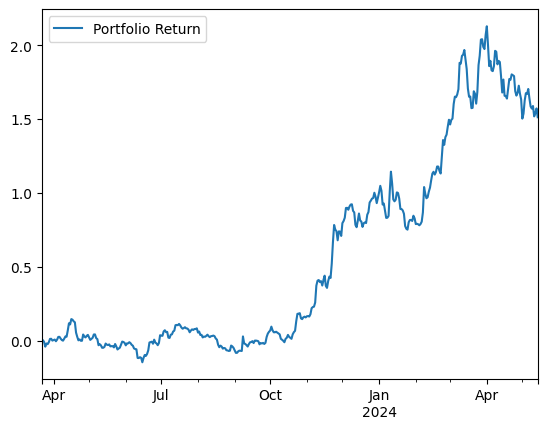

In [92]:
rl_cumulative_return.plot()

In [93]:
rl_normalized_returns.set_index('DAY', inplace=True)
rl_normalized_returns

,PanamaDAO_treasury_return
DAY,
2023-03-22,100.000000
2023-03-23,101.556520
2023-03-24,100.356777
2023-03-25,97.173470
2023-03-26,99.345631
...,...
2024-05-10,259.806365
2024-05-11,252.778203
2024-05-12,254.886030


In [94]:
# Find the index of the highest value in the Series
max_index = rl_portfolio_returns.idxmax()

print("Index of the highest value:", max_index)
print("Highest value:", rl_portfolio_returns.loc[max_index])


Index of the highest value: Portfolio Return   2023-09-08
dtype: datetime64[ns]
Highest value:             Portfolio Return
2023-09-08          0.105103


In [95]:
composition_df

,COMPOSITION_COMP,COMPOSITION_CWBTC,COMPOSITION_DPI,COMPOSITION_ETH,COMPOSITION_GFI,COMPOSITION_MKR,COMPOSITION_PAXG,COMPOSITION_RETH,COMPOSITION_RPL,COMPOSITION_SOL,COMPOSITION_UNI,COMPOSITION_USDC,COMPOSITION_WBTC,COMPOSITION_WETH,COMPOSITION_WSTETH
2023-03-22,0.000000,0.0,0.000000,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
2023-03-22,0.000000,0.0,0.000000,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
2023-03-23,0.000000,0.0,0.000000,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
2023-03-24,0.000000,0.0,0.000000,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
2023-03-25,0.000000,0.0,0.000000,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-10,0.000000,0.0,0.000000,0.199172,0.0,0.173820,0.097694,0.106748,0.018760,0.000000,0.000000,0.0,0.181580,0.043334,0.178891
2024-05-11,0.000000,0.0,0.000000,0.196637,0.0,0.177175,0.099882,0.107561,0.019004,0.000000,0.000000,0.0,0.180442,0.042783,0.176516
2024-05-12,0.129113,0.0,0.129113,0.200000,0.0,0.000000,0.000000,0.000000,0.101563,0.115292,0.083679,0.0,0.046133,0.065993,0.129113
2024-05-13,0.131798,0.0,0.127039,0.200001,0.0,0.000000,0.000000,0.000000,0.101715,0.115884,0.081793,0.0,0.046642,0.065993,0.129136


In [96]:
max_index

Portfolio Return   2023-09-08
dtype: datetime64[ns]

In [97]:
composition_df.index

DatetimeIndex(['2023-03-22', '2023-03-22', '2023-03-23', '2023-03-24',
               '2023-03-25', '2023-03-26', '2023-03-27', '2023-03-28',
               '2023-03-29', '2023-03-30',
               ...
               '2024-05-05', '2024-05-06', '2024-05-07', '2024-05-08',
               '2024-05-09', '2024-05-10', '2024-05-11', '2024-05-12',
               '2024-05-13', '2024-05-14'],
              dtype='datetime64[ns]', length=421, freq=None)

## Highest Rreturn Portfolio

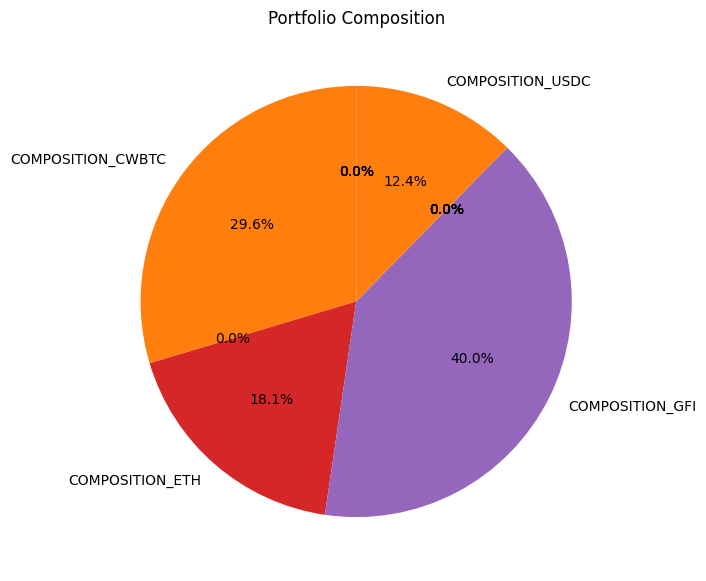

In [98]:
composition_df.loc[max_index].sum()
highest_comp_mvo = composition_df.loc[max_index].iloc[0]
# Plot the pie chart


plt.figure(figsize=(10, 7))
highest_comp_mvo.plot.pie(autopct='%1.1f%%', startangle=90)
plt.title('Portfolio Composition')
plt.ylabel('')  # Hide the y-label
plt.show()



<Axes: xlabel='DAY'>

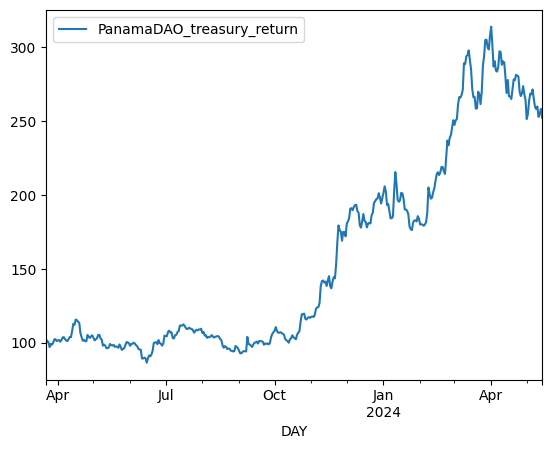

In [99]:
rl_normalized_returns.plot()

In [100]:
latest_comp_rl = composition_df.iloc[-1]
# Plot the pie chart
def rl_composition():
    plt.figure(figsize=(10, 7))
    latest_comp_rl.plot.pie(autopct='%1.1f%%', startangle=90)
    plt.title('Portfolio Composition')
    plt.ylabel('')  # Hide the y-label
    plt.show()

In [101]:
rl_portfolio_returns.max()

Portfolio Return    0.105103
dtype: float64

In [102]:
rl_portfolio_returns[rl_portfolio_returns.index >= panama_dao_start_date]

,Portfolio Return
2023-03-22,-0.007044
2023-03-23,0.015676
2023-03-24,-0.011896
2023-03-25,-0.031944
2023-03-26,0.022517
...,...
2024-05-10,0.006753
2024-05-11,-0.027125
2024-05-12,0.008362
2024-05-13,0.012963


In [103]:
sortino(rl_portfolio_returns.values)

Sortino Ratio: 2.4666827367209287


2.4666827367209287

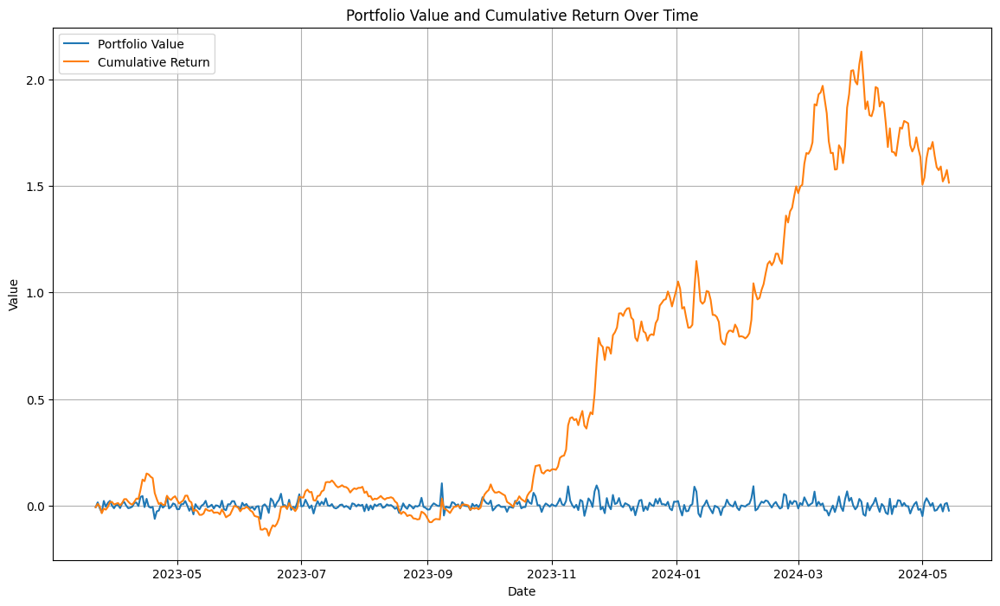

In [104]:
# Plotting the portfolio value and cumulative return
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 8))
plt.plot(rl_portfolio_returns.index, rl_portfolio_returns, label='Portfolio Value')
plt.plot(rl_cumulative_return.index, rl_cumulative_return, label='Cumulative Return')
plt.title('Portfolio Value and Cumulative Return Over Time')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()

In [105]:
# Assuming `cumulative_return` is a Series with index as `DAY`

# Convert cumulative_return Series to a DataFrame and reset index to get `DAY` as a column
cumulative_return_df = rl_cumulative_return.reset_index()
cumulative_return_df.columns = ['DAY', 'cumulative_return']

# Prepare base return (use cumulative_return as the base)
base_return = cumulative_return_df.copy()
base_return = base_return.dropna().rename(columns={'cumulative_return': 'base_cumulative_return'})

# Combine results
combined = base_return[['DAY', 'base_cumulative_return']].sort_values('DAY')

# Normalize returns
first_value = combined['base_cumulative_return'].iloc[0]
combined['PanamaDAO_treasury_return'] = 100 + (100 * (combined['base_cumulative_return'] - first_value))

# Final output
rl_normalized_returns = combined[['DAY', 'PanamaDAO_treasury_return']]

# Print the first few rows of normalized returns
print(rl_normalized_returns.head())
print(rl_normalized_returns.tail())


         DAY  PanamaDAO_treasury_return
0 2023-03-22                 100.000000
1 2023-03-23                 101.556520
2 2023-03-24                 100.356777
3 2023-03-25                  97.173470
4 2023-03-26                  99.345631
           DAY  PanamaDAO_treasury_return
415 2024-05-10                 259.806365
416 2024-05-11                 252.778203
417 2024-05-12                 254.886030
418 2024-05-13                 258.180866
419 2024-05-14                 252.221014


<Axes: xlabel='DAY'>

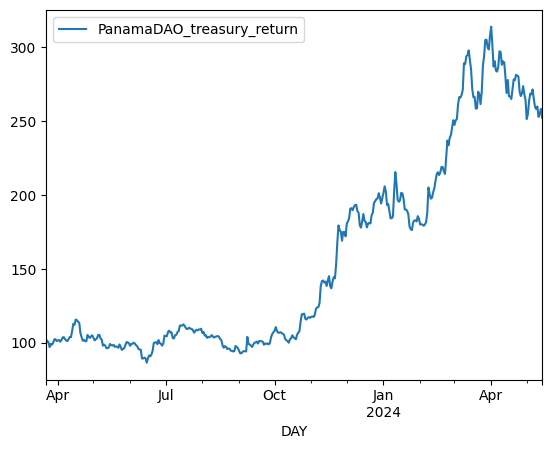

In [106]:
rl_normalized_returns.set_index('DAY', inplace=True)
rl_normalized_returns.plot()

# Comparing Historical Vs MVO Vs RL

## Daily Returns

In [107]:
rl_portfolio_returns

,Portfolio Return
2023-03-22,-0.007044
2023-03-23,0.015676
2023-03-24,-0.011896
2023-03-25,-0.031944
2023-03-26,0.022517
...,...
2024-05-10,0.006753
2024-05-11,-0.027125
2024-05-12,0.008362
2024-05-13,0.012963


In [108]:
mvo_daily_portfolio_returns

DAY
2023-03-22    0.000000
2023-03-23    0.015676
2023-03-24   -0.008486
2023-03-25   -0.026284
2023-03-26    0.029485
                ...   
2024-05-10    0.040009
2024-05-11   -0.031062
2024-05-12    0.003117
2024-05-13   -0.000661
2024-05-14   -0.013057
Length: 420, dtype: float64

In [109]:
historial_returns

DAY
2023-03-22    0.000000
2023-03-23    0.046858
2023-03-24   -0.032750
2023-03-25   -0.008282
2023-03-26    0.016828
                ...   
2024-05-11    0.001767
2024-05-12    0.005125
2024-05-13    0.005228
2024-05-14   -0.021652
2024-05-15    0.048022
Name: weighted_daily_return, Length: 421, dtype: float64

In [110]:
historical_sortino = sortino(historial_returns)

Sortino Ratio: 1.2693864228573957


In [111]:
mvo_sortino = sortino(mvo_daily_portfolio_returns)

Sortino Ratio: 1.770048123155107


In [112]:
rl_sortino = sortino(rl_portfolio_returns.values)

Sortino Ratio: 2.4666827367209287


## Cumulative Returns

In [113]:
rl_cumulative_return

,Portfolio Return
2023-03-22,-0.007044
2023-03-23,0.008522
2023-03-24,-0.003476
2023-03-25,-0.035309
2023-03-26,-0.013587
...,...
2024-05-10,1.591020
2024-05-11,1.520739
2024-05-12,1.541817
2024-05-13,1.574765


In [114]:
mvo_cumulative_return

DAY
2023-03-22    0.000000
2023-03-23    0.015676
2023-03-24    0.007056
2023-03-25   -0.019413
2023-03-26    0.009500
                ...   
2024-05-10    1.159876
2024-05-11    1.092786
2024-05-12    1.099310
2024-05-13    1.097923
2024-05-14    1.070531
Length: 420, dtype: float64

In [115]:
historical_cumulative_return

DAY
2023-03-22    0.000000
2023-03-23    0.046858
2023-03-24    0.012573
2023-03-25    0.004187
2023-03-26    0.021086
                ...   
2024-05-11    0.669062
2024-05-12    0.677617
2024-05-13    0.686387
2024-05-14    0.649874
2024-05-15    0.729104
Name: cumulative_return, Length: 421, dtype: float64

## Normalized Returns

In [116]:
rl_normalized_returns

,PanamaDAO_treasury_return
DAY,
2023-03-22,100.000000
2023-03-23,101.556520
2023-03-24,100.356777
2023-03-25,97.173470
2023-03-26,99.345631
...,...
2024-05-10,259.806365
2024-05-11,252.778203
2024-05-12,254.886030


In [117]:
mvo_normalized_returns

,PanamaDAO_treasury_return
DAY,
2023-03-22,100.000000
2023-03-23,101.567561
2023-03-24,100.705644
2023-03-25,98.058745
2023-03-26,100.950045
...,...
2024-05-10,215.987599
2024-05-11,209.278592
2024-05-12,209.930988


In [118]:
historical_normalized_returns

,PanamaDAO_treasury_return
DAY,
2023-03-22,100.000000
2023-03-23,104.685779
2023-03-24,101.257342
2023-03-25,100.418732
2023-03-26,102.108572
...,...
2024-05-11,166.906223
2024-05-12,167.761691
2024-05-13,168.638729


In [119]:
indicies_path = '../data/index.csv'
indicies = pd.read_csv(indicies_path)
indicies.set_index('DAY', inplace=True)
indicies.dropna(inplace=True)
index_start = indicies.index[-1]
index_start
indicies

,DEFI_TREASURY_INDEX,NON_DEFI_TREASURY_INDEX,SIRLOIN_INDEX,SOL_NORMALIZED_PRICE,SOL_DAILY_RETURN,WBTC_NORMALIZED_PRICE,WBTC_DAILY_RETURN,WETH_NORMALIZED_PRICE,WETH_DAILY_RETURN
DAY,,,,,,,,,
2024-04-10 00:00:00.000,331.532985,152.666757,149.274671,1761.541006,-0.029724,224.348602,-0.014448,179.160515,-0.026137
2024-04-09 00:00:00.000,323.043515,151.469809,149.344325,1815.505421,-0.022194,227.637481,-0.012830,183.968855,0.006446
2024-04-08 00:00:00.000,334.782688,158.417775,154.056552,1856.713672,-0.003111,230.596001,0.024707,182.790592,0.054050
2024-04-07 00:00:00.000,321.268745,149.316825,147.802941,1862.507239,0.020615,225.036076,0.019246,173.417416,0.016369
2024-04-06 00:00:00.000,324.294190,147.658184,145.435499,1824.887733,0.006638,220.786921,0.009018,170.624384,0.013138
...,...,...,...,...,...,...,...,...,...
2023-07-07 00:00:00.000,96.904798,97.600896,97.411673,106.384528,0.038864,97.919065,-0.010477,95.125652,-0.022174
2023-07-06 00:00:00.000,95.610971,97.396848,96.985020,102.404674,0.046008,98.955817,-0.003224,97.282814,-0.009450
2023-07-05 00:00:00.000,98.040628,98.682808,98.707155,97.900477,-0.019415,99.275909,-0.012288,98.210907,-0.015650


In [120]:
def normalize(data, date):
    # Convert Series to DataFrame and ensure it has a 'cumulative_return' column
    if isinstance(data, pd.Series):
        data = data.to_frame(name='cumulative_return')
    else:
        data = data.rename(columns={'Portfolio Return': 'cumulative_return'})

    # Convert the DataFrame to reset index to allow slicing by position
    cumulative_return_df = data.reset_index()

    # Rename the index to 'DAY' if it doesn't already have that column
    if 'index' in cumulative_return_df.columns:
        cumulative_return_df = cumulative_return_df.rename(columns={'index': 'DAY'})

    # Convert the 'DAY' column to datetime if it's not already
    cumulative_return_df['DAY'] = pd.to_datetime(cumulative_return_df['DAY'])

    # Filter the DataFrame to start from the specified date
    cumulative_return_df = cumulative_return_df[cumulative_return_df['DAY'] >= pd.to_datetime(date)]
    
    # Prepare base return (use cumulative_return as the base)
    base_return = cumulative_return_df.copy().dropna()
    
    # Drop any existing columns and rename them
    base_return = base_return[['DAY', 'cumulative_return']].rename(columns={'cumulative_return': 'base_cumulative_return'})

    # Combine results
    combined = base_return.sort_values('DAY')
    
    # Normalize returns
    first_value = combined['base_cumulative_return'].iloc[0]  # Get the first value
    combined['treasury_return'] = 100 + (100 * (combined['base_cumulative_return'] - first_value))
    
    # Final output
    normalized_returns = combined[['DAY', 'treasury_return']]
    normalized_returns.set_index('DAY', inplace=True)
    
    return normalized_returns


In [121]:
rl_cumulative_return

,Portfolio Return
2023-03-22,-0.007044
2023-03-23,0.008522
2023-03-24,-0.003476
2023-03-25,-0.035309
2023-03-26,-0.013587
...,...
2024-05-10,1.591020
2024-05-11,1.520739
2024-05-12,1.541817
2024-05-13,1.574765


In [122]:
index_historical_normalized = normalize(historical_cumulative_return, index_start)
index_rl_normalized = normalize(rl_cumulative_return, index_start)
index_mvo_normalized = normalize(mvo_cumulative_return, index_start)

In [123]:
index_mvo_normalized.rename(columns={'treasury_return':'MVO Treasury Robo Advisor Return'}, inplace=True)

In [124]:
index_rl_normalized.rename(columns={'treasury_return':'RL Treasury Robo Advisor Return'}, inplace=True)

In [125]:
index_historical_normalized.rename(columns={'treasury_return':'Historical PanamaDAO Treasury Return'}, inplace=True)

In [126]:
index_historical_normalized.index

DatetimeIndex(['2023-07-03', '2023-07-04', '2023-07-05', '2023-07-06',
               '2023-07-07', '2023-07-08', '2023-07-09', '2023-07-10',
               '2023-07-11', '2023-07-12',
               ...
               '2024-05-06', '2024-05-07', '2024-05-08', '2024-05-09',
               '2024-05-10', '2024-05-11', '2024-05-12', '2024-05-13',
               '2024-05-14', '2024-05-15'],
              dtype='datetime64[ns]', name='DAY', length=318, freq=None)

In [127]:
indicies.index = pd.to_datetime(indicies.index)
combined_indicies = indicies.merge(index_historical_normalized, left_index=True, right_index=True, how='left')
combined_indicies = combined_indicies.merge(index_mvo_normalized, left_index=True, right_index=True, how='left')
combined_indicies = combined_indicies.merge(index_rl_normalized, left_index=True, right_index=True, how='left')

In [128]:
combined_indicies.columns

Index(['DEFI_TREASURY_INDEX', 'NON_DEFI_TREASURY_INDEX', 'SIRLOIN_INDEX',
       'SOL_NORMALIZED_PRICE', 'SOL_DAILY_RETURN', 'WBTC_NORMALIZED_PRICE',
       'WBTC_DAILY_RETURN', 'WETH_NORMALIZED_PRICE', 'WETH_DAILY_RETURN',
       'Historical PanamaDAO Treasury Return',
       'MVO Treasury Robo Advisor Return', 'RL Treasury Robo Advisor Return'],
      dtype='object')

In [129]:
combined_indicies.drop(columns=['WBTC_DAILY_RETURN','SOL_DAILY_RETURN','WETH_DAILY_RETURN','SOL_NORMALIZED_PRICE','WBTC_NORMALIZED_PRICE','WETH_NORMALIZED_PRICE'], inplace=True)

C:\Users\brand\AppData\Local\Temp\ipykernel_11560\3397928614.py:17: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rl_return = float(rl_cumulative_return.iloc[-1]) * 100


historical cumulative return 72.91%
rl cumulative return 151.52%
mvo cumulative return 107.05%


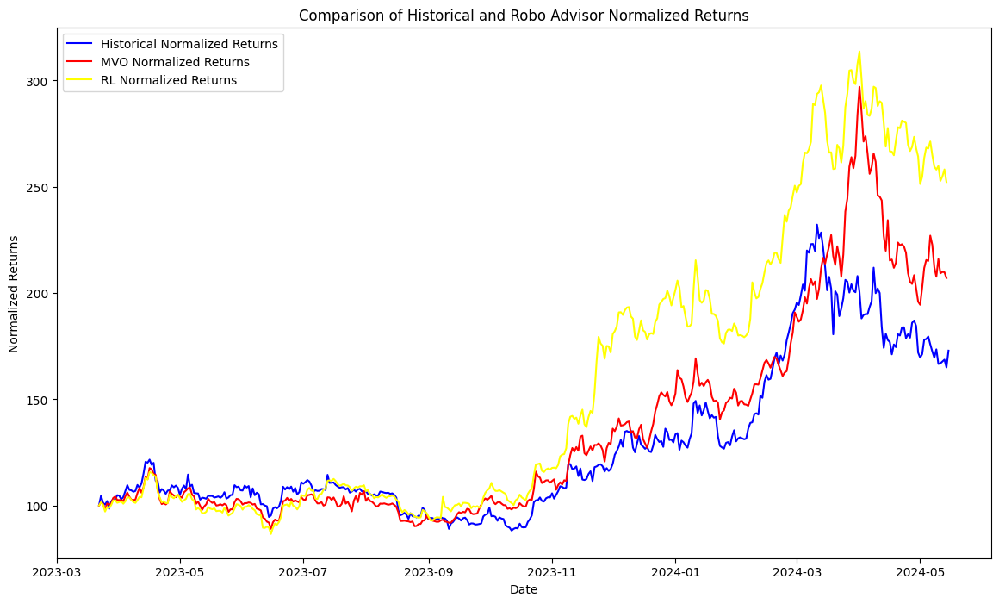

In [130]:
import matplotlib.pyplot as plt

# Plot the comparison
plt.figure(figsize=(14, 8))
plt.plot(historical_normalized_returns.index, historical_normalized_returns['PanamaDAO_treasury_return'], label='Historical Normalized Returns', color='blue')
plt.plot(mvo_normalized_returns.index, mvo_normalized_returns['PanamaDAO_treasury_return'], label='MVO Normalized Returns', color='red')
plt.plot(rl_normalized_returns.index, rl_normalized_returns['PanamaDAO_treasury_return'], label='RL Normalized Returns', color='yellow')

# Add title and labels
plt.title('Comparison of Historical and Robo Advisor Normalized Returns')
plt.xlabel('Date')
plt.ylabel('Normalized Returns')
plt.legend()

# Extract the last values from each cumulative return Series
historical_return = float(historical_cumulative_return.iloc[-1]) * 100
rl_return = float(rl_cumulative_return.iloc[-1]) * 100
mvo_return = float(mvo_cumulative_return.iloc[-1]) * 100

# Convert the returns to strings and print
print(f'historical cumulative return {historical_return:.2f}%')
print(f'rl cumulative return {rl_return:.2f}%')
print(f'mvo cumulative return {mvo_return:.2f}%')

plt.show()


In [ ]:
plt.figure(figsize=(14, 8))  # Adjust the width and height as needed
plt.plot(combined_indicies)
plt.legend(combined_indicies.columns)
plt.title('Normalized Comparison of DAO Indicies to Robo Advisor Returns')
plt.show()


In [ ]:
latest_comp_mvo

In [ ]:
latest_historical_comp

In [ ]:
latest_comp_rl

In [ ]:
import matplotlib.pyplot as plt

# Define a function to plot pie chart for MVO composition
def mvo_composition(ax): 
    latest_comp_mvo.plot.pie(autopct='%1.1f%%', startangle=90, ax=ax)
    ax.set_title('MVO Portfolio Composition')
    ax.set_ylabel('')  # Hide the y-label

# Define a function to plot pie chart for historical composition
def historical_composition(ax):
    latest_historical_comp.plot.pie(autopct='%1.1f%%', startangle=90, ax=ax)
    ax.set_title('Historical Portfolio Composition')
    ax.set_ylabel('')  # Hide the y-label

# Define a function to plot pie chart for RL composition
def rl_composition(ax):
    latest_comp_rl.plot.pie(autopct='%1.1f%%', startangle=90, ax=ax)
    ax.set_title('RL Portfolio Composition')
    ax.set_ylabel('')  # Hide the y-label

# Create subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

mvo_composition(axs[0])
historical_composition(axs[1])
rl_composition(axs[2])

plt.tight_layout()
plt.show()


## Market Comparisons - Beta

In [ ]:
#!pip install scikit-learn

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
# Align the data sets by date
# Prepare data for linear regression

def calculate_beta(data, columnx, columny):
    X = data[f'{columnx}'].values.reshape(-1, 1)  # DPI returns
    Y = data[f'{columny}'].values  # MKR returns

    # Fit the linear regression model
    model = LinearRegression()
    model.fit(X, Y)

    # Output the beta
    beta = model.coef_[0]
    return beta


In [ ]:
def calculate_cagr(history):
    initial_value = history.iloc[0]
    final_value = history.iloc[-1]
    number_of_years = (history.index[-1] - history.index[0]).days / 365.25

    cagr = (final_value / initial_value) ** (1 / number_of_years) - 1
    cagr_percentage = cagr * 100
    print(f"The CAGR is {cagr_percentage:.2f}%")
    return cagr

In [ ]:
combined_indicies.columns

In [ ]:
rl_beta = calculate_beta(combined_indicies, 'SIRLOIN_INDEX', 'RL Treasury Robo Advisor Return')
rl_cagr = calculate_cagr(combined_indicies['RL Treasury Robo Advisor Return'])
print(f"Beta: {rl_beta}")


In [ ]:
mvo_beta = calculate_beta(combined_indicies, 'SIRLOIN_INDEX', 'MVO Treasury Robo Advisor Return')
mvo_cagr = calculate_cagr(combined_indicies['MVO Treasury Robo Advisor Return'])
print(f"Beta: {mvo_beta}")


In [ ]:
historical_beta = calculate_beta(combined_indicies, 'SIRLOIN_INDEX', 'Historical PanamaDAO Treasury Return')
historical_cagr = calculate_cagr(combined_indicies['Historical PanamaDAO Treasury Return'])
print(f"Beta: {historical_beta}")


In [ ]:
prices = pivot_assets.copy()
prices.set_index('DAY', inplace=True)
dpi_history = prices['DAILY_PRICE_DPI']

In [ ]:
dpi_history.head()

In [ ]:

dpi_cagr = calculate_cagr(dpi_history)
    
dpi_cumulative_risk_premium = dpi_cagr - current_risk_free
print('CAGR:', dpi_cagr)
print('Cumulative Risk Premium:',dpi_cumulative_risk_premium)
dpi_history.plot()

In [ ]:
#DEFI_TREASURY_INDEX

defi_index_history = combined_indicies['DEFI_TREASURY_INDEX']

defi_index_cagr = calculate_cagr(defi_index_history)
defi_index_cumulative_risk_premium = defi_index_cagr - current_risk_free
print('CAGR:', defi_index_cagr)
print('Cumulative Risk Premium:',defi_index_cumulative_risk_premium)

defi_index_history.plot()

In [ ]:
#DEFI_TREASURY_INDEX

sirloin_history = combined_indicies['SIRLOIN_INDEX']

sirloin_cagr = calculate_cagr(sirloin_history)
sirloin_cumulative_risk_premium = sirloin_cagr - current_risk_free
print('CAGR:', sirloin_cagr)
print('Cumulative Risk Premium:',sirloin_cumulative_risk_premium)

sirloin_history.plot()

In [ ]:
current_risk_free

In [ ]:
import plotly.graph_objs as go

In [ ]:
combined_indicies.columns

In [ ]:
defi_index_cagr = calculate_cagr(combined_indicies['DEFI_TREASURY_INDEX'])
non_defi_index_cagr = calculate_cagr(combined_indicies['NON_DEFI_TREASURY_INDEX'])

defi_index_beta = calculate_beta(combined_indicies, 'SIRLOIN_INDEX', 'DEFI_TREASURY_INDEX')
non_defi_index_beta = calculate_beta(combined_indicies, 'SIRLOIN_INDEX', 'NON_DEFI_TREASURY_INDEX')



In [ ]:
defi_index_beta

In [ ]:
non_defi_index_beta

In [ ]:
def create_interactive_sml(risk_free_rate, market_risk_premium, rl_beta, mvo_beta, historical_beta, defi_beta, non_defi_beta, rl_return, mvo_return, historical_return, defi_return, non_defi_return):
        betas = np.linspace(0, 5, 100)
        expected_returns = risk_free_rate + betas * market_risk_premium
    
        # Create the SML line
        sml_line = go.Scatter(x=betas, y=expected_returns, mode='lines', name=f'SML')
    
        # Add MakerDAO token as points for expected (based on selected market risk premium) and actual returns
        rl_expected = go.Scatter(
            x=[rl_beta],
            y=[risk_free_rate + rl_beta * market_risk_premium],  # Use the selected market risk premium
            mode='markers', 
            marker=dict(color='red'),
            name=f'RL Expected'
        )
        
        rl_actual = go.Scatter(
            x=[rl_beta],
            y=[rl_return],
            mode='markers', 
            marker=dict(color='pink'),
            name=f'RL Actual'
        )
    
        # Add LidoDAO token as points for expected and actual returns
        mvo_expected = go.Scatter(
            x=[mvo_beta],
            y=[risk_free_rate + mvo_beta * market_risk_premium],  # Use the selected market risk premium
            mode='markers', 
            marker=dict(color='blue'),
            name=f'MVO Expected'
        )
        
        mvo_actual = go.Scatter(
            x=[mvo_beta],
            y=[mvo_return],
            mode='markers', 
            marker=dict(color='lightblue'),
            name=f'MVO Actual'
        )
    
        # Convert rpl_beta from array to scalar if necessary
        #rpl_beta_value = rpl_beta[0] if isinstance(rpl_beta, np.ndarray) else rpl_beta
    
        # Add Rocket Pool token as points for expected and actual returns
        historical_expected = go.Scatter(
            x=[historical_beta],
            y=[risk_free_rate + historical_beta * market_risk_premium],  # Use the selected market risk premium
            mode='markers',
            marker=dict(color='orange'),
            name='Historical Expected'
        )
        
        historical_actual = go.Scatter(
            x=[historical_beta],
            y=[historical_return],
            mode='markers',
            marker=dict(color='yellow'),
            name='Historical Actual'
        )
        
        defi_expected = go.Scatter(
            x=[defi_beta],
            y=[risk_free_rate + defi_beta * market_risk_premium],  # Use the selected market risk premium
            mode='markers',
            marker=dict(color='purple'),
            name='Defi Treasury Index Expected'
        )
        
        defi_actual = go.Scatter(
            x=[defi_beta],
            y=[defi_return],
            mode='markers',
            marker=dict(color='navy'),
            name='Defi Treasury Index Actual'
        )
        
        non_defi_expected = go.Scatter(
            x=[non_defi_beta],
            y=[risk_free_rate + non_defi_beta * market_risk_premium],  # Use the selected market risk premium
            mode='markers',
            marker=dict(color='grey'),
            name='Non-Defi Treasury Index Expected'
        )
        
        non_defi_actual = go.Scatter(
            x=[non_defi_beta],
            y=[non_defi_return],
            mode='markers',
            marker=dict(color='tan'),
            name='Non-Defi Treasury Index Actual'
        )
        
        
    
        # Add Risk-Free Rate line
        risk_free_line = go.Scatter(
            x=[0, max(betas)], 
            y=[risk_free_rate, risk_free_rate], 
            mode='lines', 
            line=dict(dash='dash', color='green'),
            name='Risk-Free Rate'
        )
    
        # Layout settings
        layout = go.Layout(
            title=f'SML',
            xaxis=dict(title='Beta (Systematic Risk)'),
            yaxis=dict(title='Return'),
            showlegend=True
        )
    
        # Combine all the plots
        fig = go.Figure(data=[sml_line, rl_expected, rl_actual, mvo_expected, mvo_actual, historical_expected, historical_actual, 
                              defi_expected, defi_actual, non_defi_expected,non_defi_actual, risk_free_line], layout=layout)
        return fig, market_risk_premium


In [ ]:
historical_cagr

In [ ]:
fig, market_risk_premiume = create_interactive_sml(
    current_risk_free,
    sirloin_cumulative_risk_premium,
    rl_beta,
    mvo_beta,
    historical_beta,
    defi_index_beta,
    non_defi_index_beta,
    rl_cagr,
    mvo_cagr,
    historical_cagr,
    defi_index_cagr,
    non_defi_index_cagr

    

)

In [ ]:
fig